### Business Case :  Using clustering algorithms to categorize similar players using their traits and their different skills in the field.


### Domain Analysis :
* Name: Name of the player.
* Age: Age of the player.
* Height: Height of the player in inches (transformed to centimeters in preprocessing).
* Overall: General performance quality and value of the player representing the key positional skills and international reputation rated between 1-99. Overall attribute is used only in preprocessing and discussion stages because using it in modelling could lead to domination by this feature. The aim of the project is not basically sort and categorize the players using their overall talent and international reputation, but to cluster them based on using their whole skillset.
* Potential: Maximum Overall rating expected to be reached by a player in the top of his career rated between 1-99.
* PreferredFoot: Right or Left. Label encoder is applied as 0 for left and 1 for right.
* WeakFoot: Represents how well a player uses his weak foot (e.g. left for righties) rated between 1 to 5.
* WorkRate: Degree of the effort the player puts in terms of attack and defense rated as low, medium and high. This feature is divided into two new features as AttackWorkRate and DefenseWorkRate. Besides, label encoder is applied as 0 for low, 0.5 for medium and 1 for high.
* Position: Position of the players on the pitch which determines their roles and responsibilities in the team. Forward positions in the football and FIFA 20 can be grouped as striker (ST: center striker, RS: right striker, LS: left striker), forward (CF: center forward, RF: right forward, LF: left forward) and winger (RW: right winger, LW: left winger). The word, forward, is used both as a general term and a special position. Strikers are positioned in front of forwards and wingers and very closed to the opposing goal. Their main responsibilities are attacking and scoring goals, that’s why their ball control, shooting and finishing skills are expected to be well. Center forwards are positioned right behind the strikers. They are expected to receive balls from the others and score assists to the others or goals. In addition to the skills expected from strikers, they have to be good at passing. Right forwards and left forwards are positioned at the right and left of the center forwards with the same expectations. Wingers are positioned near the touchlines to create chances for strikers and forwards from the right and left side of the field by breakthrough and crosses and to score goals. They are expected to be good at dribbling, acceleration, passing and crossing. Positions are used only in preprocessing and discussion stages.
* ST: Positional skill. Player’s general ability when playing in ST position rated between 1-99.
* RS: Positional skill. Player’s general ability when playing in in RS position rated between 1-99.
* LS: Positional skill. Player’s general ability when playing in in LS position rated between 1-99.
* CF: Positional skill. Player’s general ability when playing in in CF position rated between 1-99.
* RF: Positional skill. Player’s general ability when playing in in RF position rated between 1-99.
* LF: Positional skill. Player’s general ability when playing in in LF position rated between 1-99.
* RW: Positional skill. Player’s general ability when playing in in RW position rated between 1-99.
* LW: Positional skill. Player’s general ability when playing in in LW position rated between 1-99.
* Crossing: Crossing skill of the player rated between 1-99. Cross is a long-range pass from wings to center.
* Finishing: Finishing skill of the player rated between 1-99. Finishing in football refers to finish an attack by scoring a goal.
* HeadingAccuracy: Player’s accuracy to pass or shoot by using his head rated between 1-99.
* ShortPassing: Player’s accuracy for short passes rated between 1-99.
* LongPassing: Player’s accuracy for long passes rated between 1-99.
* Dribbling: Dribbling skill of the player rated between 1-99. Dribbling is carrying the ball without losing while moving in one particular direction.
* SprintSpeed: Speed rate of the player rated between 1-99.
* Acceleration: Shows how fast a player can reach his maximum sprint speed rated between 1-99.
* FKAccuracy: Player’s accuracy to score free kick goals rated between 1-99.
* BallControl: Player’s ability to control the ball rated between 1-99.
* Balance: Player’s ability to remain steady while running, carrying and controlling the ball rated between 1-99.
* ShotPower: Player’s strength level of shooting the ball rated between 1-99.
* Jumping: Player’s jumping skill rated between 1-99.
* Penalties: Player’s accuracy to score goals from penalty rated between 1-99.
* Strength: Physical strength of the player rated between 1-99.
* Agility: Gracefulness and quickness of the player while controlling the ball rated between 1-99.
* Reactions: Acting speed of the player to what happens in his environment rated between 1-99.
* Aggression: Aggression level of the player while pushing, pulling and tackling rated between 1-99.
* Positioning: Player’s ability to place himself in the right position to receive the ball or score goals rated between 1-99.
* Vision: Player’s mental awareness about the other players in the team for passing rated between 1-99.
* Volleys: Player’s ability to perform volleys rated between 1-99.
* LongShots: Player’s accuracy of shoots from long distances rated between 1-99.
* Stamina: Player’s ability to sustain his stamina level during the match rated between 1-99. Players with lower stamina get tired fast.
* Composure: Player’s ability to control his calmness and frustration during the match rated between 1-99.
* Curve: Player’s ability to curve the ball while passing or shooting rated between 1-99.
* Interceptions: Player’s ability to intercept the ball while opposite team’s players are passing rated between 1-99. It is a defensive skill.
* StandingTackle: Player’s ability to perform tackle (take the ball from the opposite player) while standing rated between 1-99. It is a defensive skill.
* SlidingTackle: Player’s ability to perform tackle by sliding rated between 1-99. It is a defensive skill.
* Marking: Player’s ability to apply strategies to prevent opposing team from taking the ball rated between 1-99. It is a defensive skill.


In [1]:
#importing libraries
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams
%matplotlib inline

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
#loading the data
data=pd.read_csv('players_20.csv')
data

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,...,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,...,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18273,245006,https://sofifa.com/player/245006/shuai-shao/20...,Shao Shuai,邵帅,22,1997-03-10,186,79,China PR,Beijing Renhe FC,...,43+2,42+2,42+2,42+2,43+2,45+2,46+2,46+2,46+2,45+2
18274,250995,https://sofifa.com/player/250995/mingjie-xiao/...,Xiao Mingjie,Mingjie Xiao,22,1997-01-01,177,66,China PR,Shanghai SIPG FC,...,44+2,43+2,43+2,43+2,44+2,46+2,47+2,47+2,47+2,46+2
18275,252332,https://sofifa.com/player/252332/wei-zhang/20/...,Zhang Wei,张威,19,2000-05-16,186,75,China PR,Hebei China Fortune FC,...,47+2,49+2,49+2,49+2,47+2,47+2,49+2,49+2,49+2,47+2
18276,251110,https://sofifa.com/player/251110/haijian-wang/...,Wang Haijian,汪海健,18,2000-08-02,185,74,China PR,Shanghai Greenland Shenhua FC,...,48+2,48+2,48+2,48+2,48+2,48+2,49+2,49+2,49+2,48+2


In [4]:
data.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,...,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,...,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3


In [5]:
data.tail()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
18273,245006,https://sofifa.com/player/245006/shuai-shao/20...,Shao Shuai,邵帅,22,1997-03-10,186,79,China PR,Beijing Renhe FC,...,43+2,42+2,42+2,42+2,43+2,45+2,46+2,46+2,46+2,45+2
18274,250995,https://sofifa.com/player/250995/mingjie-xiao/...,Xiao Mingjie,Mingjie Xiao,22,1997-01-01,177,66,China PR,Shanghai SIPG FC,...,44+2,43+2,43+2,43+2,44+2,46+2,47+2,47+2,47+2,46+2
18275,252332,https://sofifa.com/player/252332/wei-zhang/20/...,Zhang Wei,张威,19,2000-05-16,186,75,China PR,Hebei China Fortune FC,...,47+2,49+2,49+2,49+2,47+2,47+2,49+2,49+2,49+2,47+2
18276,251110,https://sofifa.com/player/251110/haijian-wang/...,Wang Haijian,汪海健,18,2000-08-02,185,74,China PR,Shanghai Greenland Shenhua FC,...,48+2,48+2,48+2,48+2,48+2,48+2,49+2,49+2,49+2,48+2
18277,233449,https://sofifa.com/player/233449/ximing-pan/20...,Pan Ximing,潘喜明,26,1993-01-11,182,78,China PR,Hebei China Fortune FC,...,48+2,49+2,49+2,49+2,48+2,48+2,50+2,50+2,50+2,48+2


In [6]:
data.shape

(18278, 104)

#### Insights: 
* there are 18278 rows and 104 columns
* It has both numerical and categoricl data

### Exploratory data Analysis
 Task 1 : Prepare a complete data analysis report on the given data.

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Columns: 104 entries, sofifa_id to rb
dtypes: float64(16), int64(45), object(43)
memory usage: 14.5+ MB


#### Insights:
* There are mixed datatypes from them 16 are float datatype, 45 are int and 43 are object datatype

In [8]:
data_float=list(data.select_dtypes('float').columns)
data_int=list(data.select_dtypes('integer').columns)
data_obj=list(data.select_dtypes('object').columns)

In [9]:
data[data_float].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   release_clause_eur    16980 non-null  float64
 1   team_jersey_number    18038 non-null  float64
 2   contract_valid_until  18038 non-null  float64
 3   nation_jersey_number  1126 non-null   float64
 4   pace                  16242 non-null  float64
 5   shooting              16242 non-null  float64
 6   passing               16242 non-null  float64
 7   dribbling             16242 non-null  float64
 8   defending             16242 non-null  float64
 9   physic                16242 non-null  float64
 10  gk_diving             2036 non-null   float64
 11  gk_handling           2036 non-null   float64
 12  gk_kicking            2036 non-null   float64
 13  gk_reflexes           2036 non-null   float64
 14  gk_speed              2036 non-null   float64
 15  gk_positioning     

#### Insights:
* There are sum null values in some features

In [10]:
data[data_int].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Data columns (total 45 columns):
 #   Column                      Non-Null Count  Dtype
---  ------                      --------------  -----
 0   sofifa_id                   18278 non-null  int64
 1   age                         18278 non-null  int64
 2   height_cm                   18278 non-null  int64
 3   weight_kg                   18278 non-null  int64
 4   overall                     18278 non-null  int64
 5   potential                   18278 non-null  int64
 6   value_eur                   18278 non-null  int64
 7   wage_eur                    18278 non-null  int64
 8   international_reputation    18278 non-null  int64
 9   weak_foot                   18278 non-null  int64
 10  skill_moves                 18278 non-null  int64
 11  attacking_crossing          18278 non-null  int64
 12  attacking_finishing         18278 non-null  int64
 13  attacking_heading_accuracy  18278 non-null  int64
 14  attack

#### Insights: 
* There is no null values in this feature

In [11]:
data[data_obj].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Data columns (total 43 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   player_url        18278 non-null  object
 1   short_name        18278 non-null  object
 2   long_name         18278 non-null  object
 3   dob               18278 non-null  object
 4   nationality       18278 non-null  object
 5   club              18278 non-null  object
 6   player_positions  18278 non-null  object
 7   preferred_foot    18278 non-null  object
 8   work_rate         18278 non-null  object
 9   body_type         18278 non-null  object
 10  real_face         18278 non-null  object
 11  player_tags       1499 non-null   object
 12  team_position     18038 non-null  object
 13  loaned_from       1048 non-null   object
 14  joined            16990 non-null  object
 15  nation_position   1126 non-null   object
 16  player_traits     7566 non-null   object
 17  ls          

#### Insights:
* In this feature there are 32 out of 43 features of datatype has null values

In [12]:
data.isnull().sum()

sofifa_id        0
player_url       0
short_name       0
long_name        0
age              0
              ... 
lb            2036
lcb           2036
cb            2036
rcb           2036
rb            2036
Length: 104, dtype: int64

In [13]:
data.describe(include='float')

,release_clause_eur,team_jersey_number,contract_valid_until,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning
count,1.698000e+04,18038.000000,18038.000000,1126.000000,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000,2036.000000,2036.000000,2036.000000,2036.000000,2036.000000,2036.000000
mean,4.740717e+06,20.103892,2021.114591,12.114565,67.700899,52.298301,57.233777,62.531585,51.553503,64.876678,65.422397,63.146365,61.832515,66.390472,37.798625,63.374754
std,1.103002e+07,16.603639,1.289888,6.735922,11.297656,14.029418,10.407844,10.284950,16.419528,9.760162,7.736278,7.244023,7.510709,8.154062,10.634038,8.447876
min,1.300000e+04,1.000000,2019.000000,1.000000,24.000000,15.000000,24.000000,23.000000,15.000000,27.000000,44.000000,42.000000,35.000000,45.000000,12.000000,41.000000
25%,5.630000e+05,9.000000,2020.000000,6.000000,61.000000,42.000000,50.000000,57.000000,36.000000,59.000000,60.000000,58.000000,57.000000,60.750000,29.000000,58.000000
50%,1.200000e+06,17.000000,2021.000000,12.000000,69.000000,54.000000,58.000000,64.000000,56.000000,66.000000,65.000000,63.000000,61.000000,66.000000,39.000000,64.000000
75%,3.700000e+06,27.000000,2022.000000,18.000000,75.000000,63.000000,64.000000,69.000000,65.000000,72.000000,70.000000,68.000000,66.000000,72.000000,46.000000,69.000000
max,1.958000e+08,99.000000,2026.000000,30.000000,96.000000,93.000000,92.000000,96.000000,90.000000,90.000000,90.000000,92.000000,93.000000,92.000000,65.000000,91.000000


#### Insights:
* Here standard deviation is not 0 anywhere
* There are no 0 values for ths feature
* some columns have more different values we need to scale them before creating the model

In [14]:
data.describe(include='integer')

,sofifa_id,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,international_reputation,weak_foot,...,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,1.827800e+04,18278.000000,18278.000000,18278.000000,...,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000
mean,219738.864482,25.283291,181.362184,75.276343,66.244994,71.546887,2.484038e+06,9456.942773,1.103184,2.944250,...,48.383357,58.528778,46.848889,47.640333,45.606631,16.572765,16.354853,16.212934,16.368038,16.709924
std,27960.200461,4.656964,6.756961,7.047744,6.949953,6.139669,5.585481e+06,21351.714095,0.378861,0.664656,...,15.708099,11.880840,20.091287,21.585641,21.217734,17.738069,16.996925,16.613665,17.136497,18.038125
min,768.000000,16.000000,156.000000,50.000000,48.000000,49.000000,0.000000e+00,0.000000,1.000000,1.000000,...,7.000000,12.000000,1.000000,5.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,204445.500000,22.000000,177.000000,70.000000,62.000000,67.000000,3.250000e+05,1000.000000,1.000000,3.000000,...,39.000000,51.000000,29.000000,27.000000,24.000000,8.000000,8.000000,8.000000,8.000000,8.000000
50%,226165.000000,25.000000,181.000000,75.000000,66.000000,71.000000,7.000000e+05,3000.000000,1.000000,3.000000,...,49.000000,60.000000,52.000000,55.000000,52.000000,11.000000,11.000000,11.000000,11.000000,11.000000
75%,240795.750000,29.000000,186.000000,80.000000,71.000000,75.000000,2.100000e+06,8000.000000,1.000000,3.000000,...,60.000000,67.000000,64.000000,66.000000,64.000000,14.000000,14.000000,14.000000,14.000000,14.000000
max,252905.000000,42.000000,205.000000,110.000000,94.000000,95.000000,1.055000e+08,565000.000000,5.000000,5.000000,...,92.000000,96.000000,94.000000,92.000000,90.000000,90.000000,92.000000,93.000000,91.000000,92.000000


#### Insights:
* Here standard deviation is not 0
* There are some columns has 0 values 
* Here also values are in different scale i.e. ones to thousands

In [15]:
data.describe(include='object')

,player_url,short_name,long_name,dob,nationality,club,player_positions,preferred_foot,work_rate,body_type,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
count,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,...,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242
unique,18278,17354,18218,6142,162,698,643,2,9,10,...,98,98,98,98,98,96,110,110,110,96
top,https://sofifa.com/player/158023/lionel-messi/...,J. Rodríguez,Liam Kelly,1992-02-29,England,FC Barcelona,CB,Right,Medium/Medium,Normal,...,59+2,59+2,59+2,59+2,59+2,61+2,63+2,63+2,63+2,61+2
freq,1,11,3,113,1667,33,2322,13960,9875,10750,...,682,636,636,636,682,667,621,621,621,667


#### Insights :
* we have max data of players from England anf FC Barcelona
* most of the players preferred right foot
* there body type is max normal
* max players varoius positionl skills is ranking in the 60s range

In [16]:
data.columns

Index(['sofifa_id', 'player_url', 'short_name', 'long_name', 'age', 'dob',
       'height_cm', 'weight_kg', 'nationality', 'club',
       ...
       'lwb', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb'],
      dtype='object', length=104)

In [17]:
#here we have all kinds of players and goal keepers. but we can not analyse them so dropping some columns

In [19]:
data.drop(['sofifa_id', 'player_url','long_name','team_jersey_number','loaned_from','nation_jersey_number',
           'player_tags','nation_position','team_jersey_number','goalkeeping_diving','goalkeeping_handling','goalkeeping_kicking',
          'goalkeeping_positioning','goalkeeping_reflexes','contract_valid_until','dob','real_face'],axis=1,inplace=True)

KeyError: "['sofifa_id', 'player_url', 'long_name', 'team_jersey_number', 'loaned_from', 'nation_jersey_number', 'player_tags', 'nation_position', 'team_jersey_number', 'goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking', 'goalkeeping_positioning', 'goalkeeping_reflexes', 'contract_valid_until', 'dob', 'real_face'] not found in axis"

In [ ]:
data.head()

In [ ]:
data.head()

In [ ]:
data.shape

### Data Visualization

#### Univariate Analysis 

In [22]:
import sweetviz as sv
my_report = sv.analyze(data)
my_report.show_html()

                                             |                                             | [  0%]   00:00 ->…

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


#### Insights:
* most of the feature are in normal distribution, they are mostly right skewed
* age is max 42 and min 16 and there median is 25
* height 205 in cm is max, and min is 156
* weight is min is 50 in kg, where 110 is max
* overall 94 is max, and 48 is min
* wage_eur is 565k is max and min is 0k also, and count of 1000 wage_eur is max
* Here right foot preferred the most 

#### Bivariate Analysis 
**player's overall rating vs some monetary features**

In [ ]:
plt.title("overall vs wager_eur",fontsize=18)
sns.scatterplot(x='overall',y='wage_eur',data=data,color='green')
plt.show()

<Axes: title={'center': 'overall vs value_eur'}, xlabel='overall', ylabel='value_eur'>

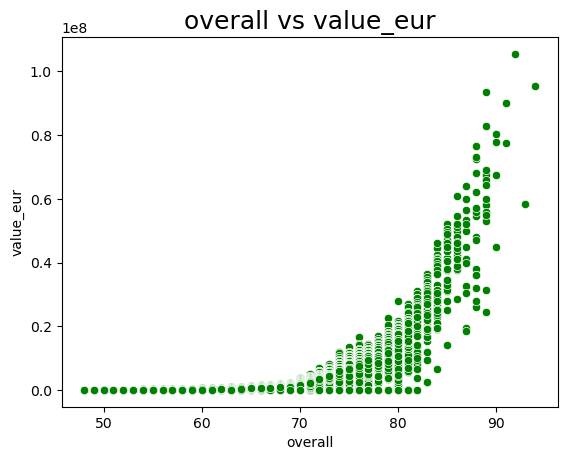

In [20]:
plt.title("overall vs value_eur",fontsize=18)
sns.scatterplot(data=data,y='value_eur',x='overall',color='green')

<Axes: title={'center': 'overall vs release_clause_eur'}, xlabel='overall', ylabel='release_clause_eur'>

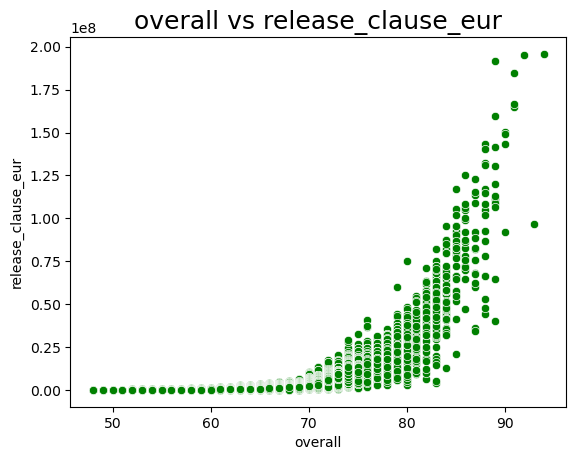

In [21]:
plt.title("overall vs release_clause_eur",fontsize=18)
sns.scatterplot(data=data,x='overall',y='release_clause_eur',color='green')

#### Insights: 
* In this three menetory feature as player's wage, value and release_clause increases overall is also increases

 **player's age vs some skill based ranking features**

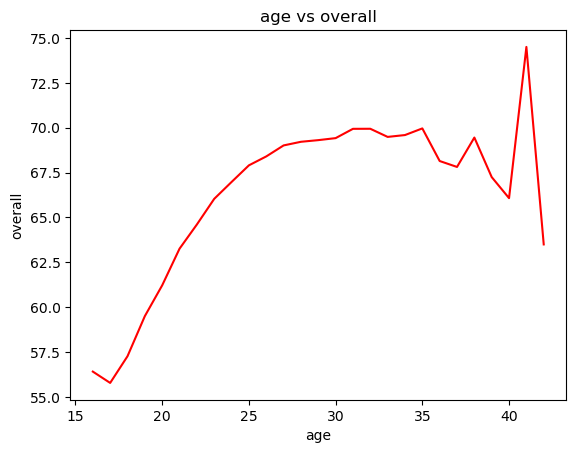

In [22]:
plt.title('age vs overall',fontsize=12)
sns.lineplot(data=data,y='overall',x='age',color='red',ci=None)
plt.show()

#### Insights:
* In age vs potential, players are improving with the steps of the years.
* The age 30 year are the best player after that they start to decline
* we can see here after 40 there is peak again we can conclude that this is because the old hand included in the game


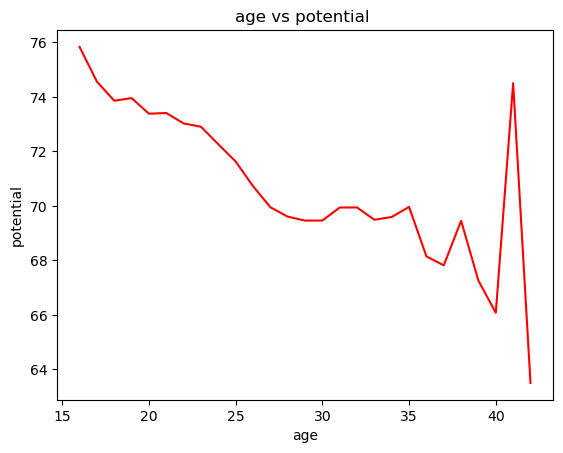

In [23]:
plt.title('age vs potential ',fontsize=12)
sns.lineplot(data=data,x='age',y='potential',color='red',ci=None)
plt.show()

#### Insights:
* Here the potential for players in age between 20-30 remains same there is slightly change
* After 35 have higher potential,which is reduced gradually with increases in age


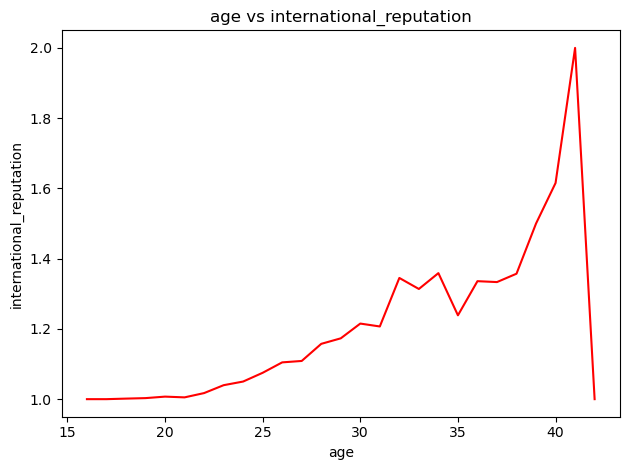

In [24]:
plt.title('age vs international_reputation',fontsize=12)
sns.lineplot(data=data,x='age',y='international_reputation',color='red',ci=None)
plt.tight_layout()

In [25]:
data.international_reputation.value_counts()


1    16794
2     1140
3      292
4       46
5        6
Name: international_reputation, dtype: int64

#### Insights: 
* as the age increases the reputation ranking decreases
* players reputation ranking above 3 is more, below 4 is less

**player height vs some key skills** 

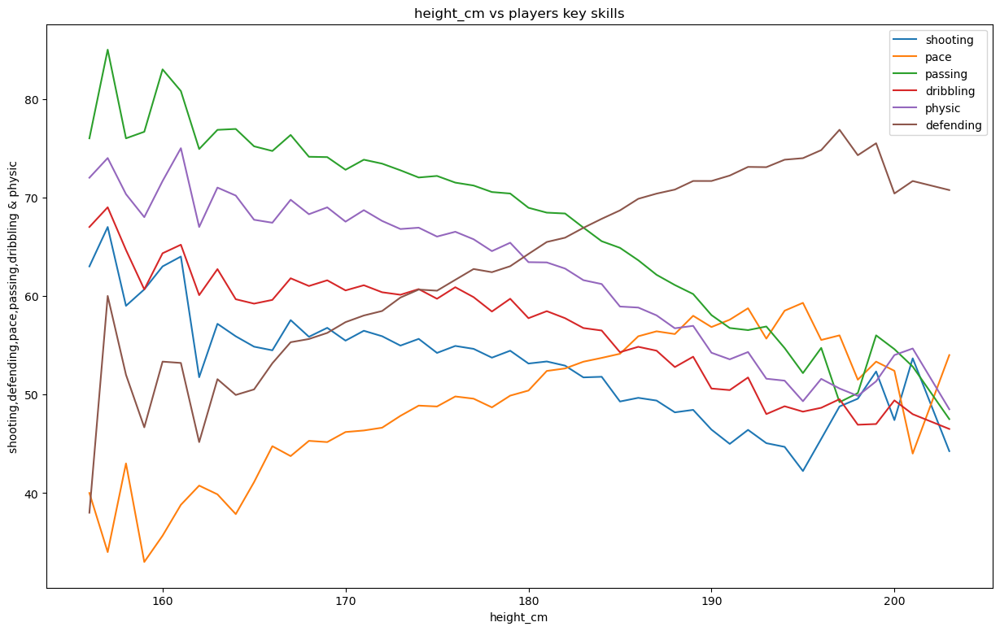

In [26]:
rcParams['figure.figsize']=15,9
sns.lineplot(x='height_cm',y='shooting',data=data,legend='brief',ci=None).set_title('height_cm vs players key skills')
sns.lineplot(x='height_cm',y='defending',data=data,legend='brief',ci=None)
sns.lineplot(x='height_cm',y='pace',data=data,legend='brief',ci=None)
sns.lineplot(x='height_cm',y='passing',data=data,legend='brief',ci=None)
sns.lineplot(x='height_cm',y='dribbling',data=data,legend='brief',ci=None)
sns.lineplot(x='height_cm',y='physic',data=data,legend='brief',ci=None).set_ylabel('shooting,defending,pace,passing,dribbling & physic')
plt.legend(['shooting','pace','passing','dribbling','physic','defending'])
plt.show()

#### Insights: 
* Here height of the player increases, shooting, defending, pace, passing, dribbling, and physic decreases beyond 190 cm
* shooting skill is very high for some players, it followed decline as height increases
* Height above 185 for them defending is good, below 175 its bad
* Players with height between 170 to 200 cm tend to have a good physic ranking and defending skill

 **Players weight vs some key skills**

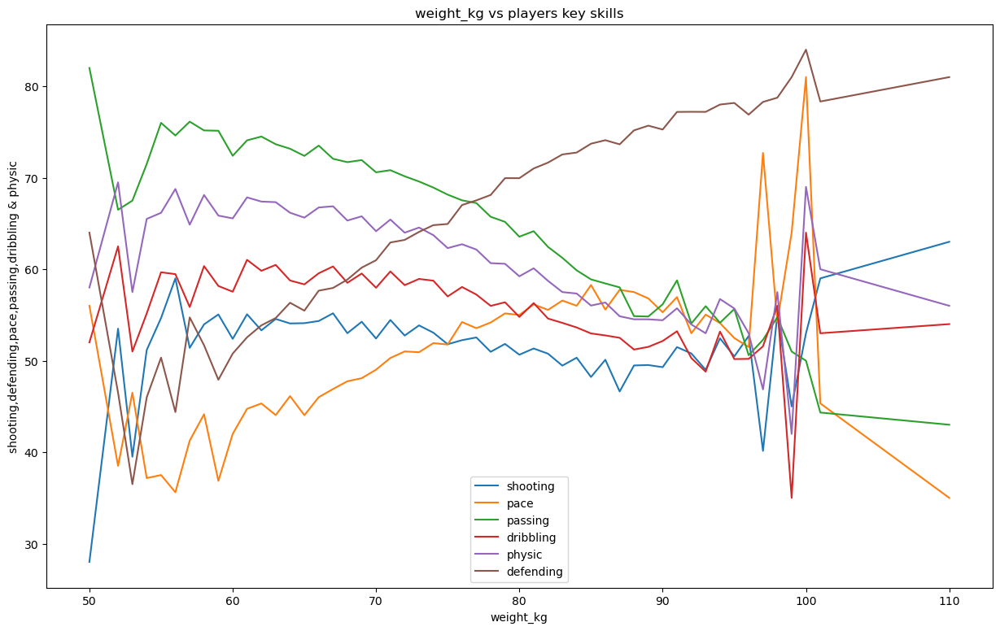

In [27]:
rcParams['figure.figsize']=15,9
sns.lineplot(x='weight_kg',y='shooting',data=data,legend='brief',ci=None).set_title('weight_kg vs players key skills')
sns.lineplot(x='weight_kg',y='defending',data=data,legend='brief',ci=None)
sns.lineplot(x='weight_kg',y='pace',data=data,legend='brief',ci=None)
sns.lineplot(x='weight_kg',y='passing',data=data,legend='brief',ci=None)
sns.lineplot(x='weight_kg',y='dribbling',data=data,legend='brief',ci=None)
sns.lineplot(x='weight_kg',y='physic',data=data,legend='brief',ci=None).set_ylabel('shooting,defending,pace,passing,dribbling & physic')
plt.legend(['shooting','pace','passing','dribbling','physic','defending'])
plt.show()

#### Insights: 
* weight above 90kg posses low pace and dribbling skills
* except some player whose weight is above 90kg posses low passing, defending and dribbling skills
* players with 90kg posses good physic ranking and also defending

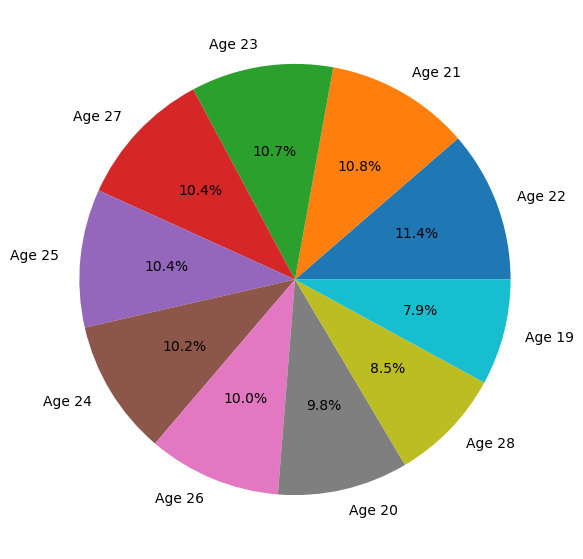

In [28]:
data_age = data.groupby(data["age"]).count()
data_age_group_sorted = data_age.sort_values(by=["short_name"], ascending=False)

data_label = []
for age in data_age_group_sorted.head(10).index:
    data_label.append("Age " + str(age))
    
plt.figure(figsize=(7,7))
plt.pie(data_age_group_sorted["short_name"].head(10), labels = data_label, autopct="%.1f%%")
plt.show()


#### Insights:
* Here the players age in decreasing order
* 22, 21, 23, 27, 25, 24, 26, 20, 28, 19 

 **players preferred foot vs age**

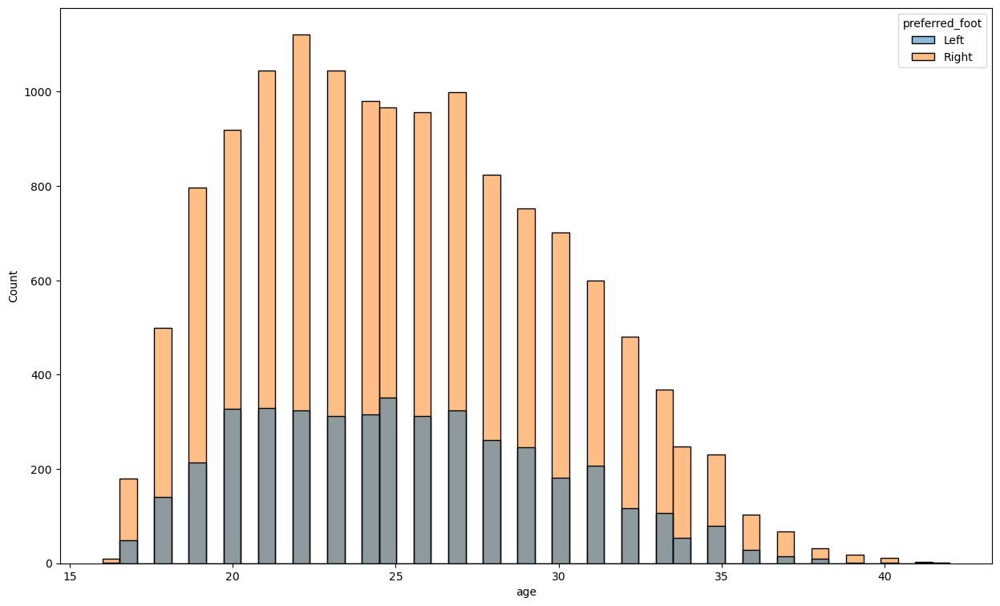

In [29]:
sns.histplot(x='age',hue="preferred_foot",data=data)
plt.show()

#### Insights:
* players preffered right foot is more tham the players preffered left foot

****Task 3(1) :  Prepare a rank ordered list of top 10 countries with most players. Which
countries are producing the most footballers that play at this level?****

In [30]:
#group by nationality
nationality_group = data.groupby(data['nationality']).count()
#sorted in decreasing order
nationality_group_sorted = nationality_group.sort_values(by=['short_name'],ascending=False)
#rank the top 10 countries with most no. of players
nationality_group_sorted['Rank']=nationality_group_sorted['short_name'].rank(ascending=False)
print(nationality_group_sorted['Rank'].head(10))

nationality
England         1.0
Germany         2.0
Spain           3.0
France          4.0
Argentina       5.0
Brazil          6.0
Italy           7.0
Colombia        8.0
Japan           9.0
Netherlands    10.0
Name: Rank, dtype: float64


#### Insights:
* England, Germany, Spain, France, Argentina, Brazil, Italy, Colombia, Japan, Netherlands this countries provides the max players

 ****Task 3(2): Plot the distribution of overall rating vs. age of players. Interpret what is the
age after which a player stops improving?****

<Axes: xlabel='age', ylabel='overall'>

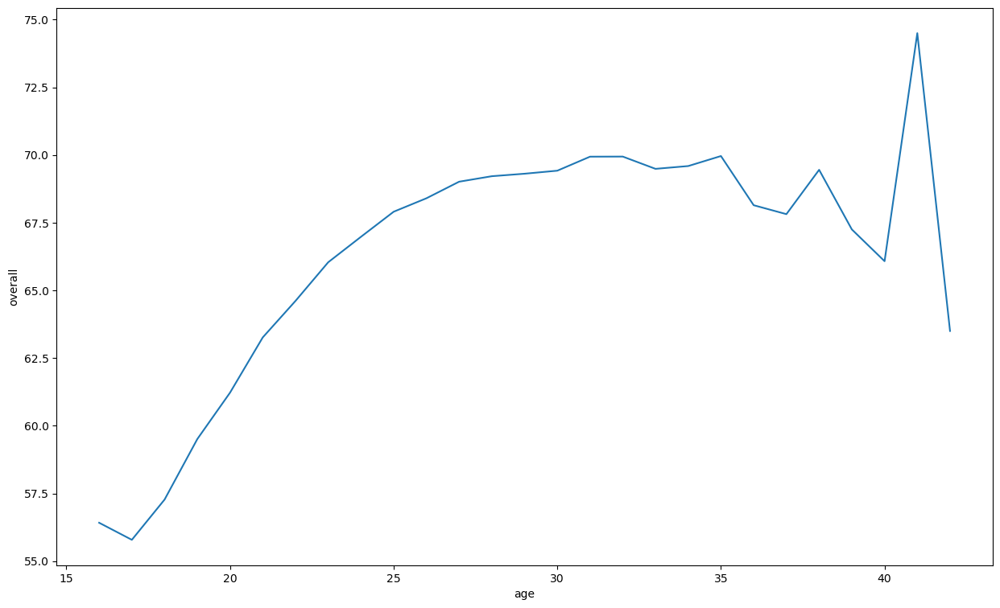

In [31]:
sns.lineplot(y='overall',x='age',data=data,ci=None)

In [32]:
#rank above 77 as superior, we could say that after the age of 34, players stop improving.

****Task 3(3): Which type of offensive players tends to get paid the most: the striker, the
right-winger, or the left-winger?****

In [33]:
fifa_data_st = data.loc[data["player_positions"].str.contains("ST")]

# Extract players who play in Right wing position
fifa_data_rw = data.loc[data["player_positions"].str.contains("RW")]

# Extract players who play in Left wing position
fifa_data_lw = data.loc[data["player_positions"].str.contains("LW")]

# Concatenate the data
fifa_data_off_players = pd.concat([fifa_data_st, fifa_data_rw, fifa_data_lw], axis=0, ignore_index=True)

In [34]:
#create a function to split the positions into different columns
def player_positions(position):
    pla_posn_len = len(position)
    global pla_posn1, pla_posn2, pla_posn3
    
    if (pla_posn_len == 2 or pla_posn_len == 3):
        pla_posn1 = position
        pla_posn2 = pla_posn3 = ''
    elif (pla_posn_len >= 4 and pla_posn_len <=8):
        pla_posn1, pla_posn2 = position.split(",")
        pla_posn3 = ''
    else:
        pla_posn1, pla_posn2, pla_posn3 = position.split(",")

In [35]:
#seperate each position into seperate column
for row in range(0,len(fifa_data_off_players)):
    fifa_data_off_players.loc[row, ["player_positions"]].apply(player_positions)
    fifa_data_off_players.loc[row, ["pla_posn1"]] = pla_posn1
    fifa_data_off_players.loc[row, ["pla_posn2"]] = pla_posn2.strip()
    fifa_data_off_players.loc[row, ["pla_posn3"]] = pla_posn3.strip()

In [36]:
fifa_data_off_players[["player_positions", "pla_posn1", "pla_posn2", "pla_posn3"]].head()

,player_positions,pla_posn1,pla_posn2,pla_posn3
0,"RW, CF, ST",RW,CF,ST
1,"ST, LW",ST,LW,
2,"RW, ST",RW,ST,
3,"ST, RW",ST,RW,
4,ST,ST,,


In [37]:
offensive_players = ["ST", "LW", "RW"]

fifa_data_off_players_posn1 = fifa_data_off_players.loc[fifa_data_off_players["pla_posn1"].isin(offensive_players)]
fifa_data_off_players_posn2 = fifa_data_off_players.loc[fifa_data_off_players["pla_posn2"].isin(offensive_players)]
fifa_data_off_players_posn3 = fifa_data_off_players.loc[fifa_data_off_players["pla_posn3"].isin(offensive_players)]

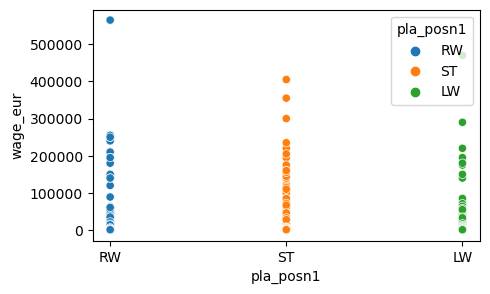

In [38]:
plt.figure(figsize=(5,3))
sns.scatterplot(data=fifa_data_off_players_posn1, x="pla_posn1", y="wage_eur", hue="pla_posn1")
plt.show()

#### Insights: 
* here right winger get most paid than striker and left winger

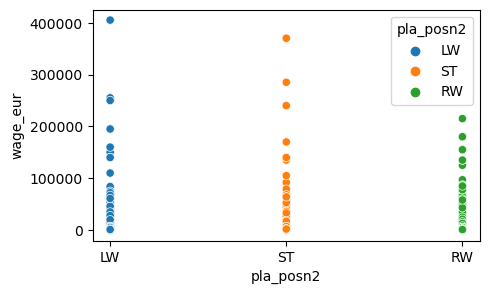

In [39]:
plt.figure(figsize=(5,3))
sns.scatterplot(data=fifa_data_off_players_posn2, x="pla_posn2", y="wage_eur", hue="pla_posn2")
plt.show()

#### Insights:
* here left winger get the most paid than striker and right winger

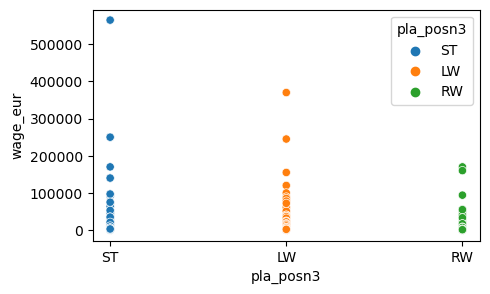

In [40]:
plt.figure(figsize=(5,3))
sns.scatterplot(data=fifa_data_off_players_posn3, x="pla_posn3", y="wage_eur", hue="pla_posn3")
plt.show()

#### Insights:
* striker get the most paid than left winger and right winger
* from this three we can say that the striker are paid more which is highest, left winger are paid second most highest wing,right winger paid the least

### Data Preprocessing

In [41]:
data.columns

Index(['short_name', 'age', 'height_cm', 'weight_kg', 'nationality', 'club',
       'overall', 'potential', 'value_eur', 'wage_eur', 'player_positions',
       'preferred_foot', 'international_reputation', 'weak_foot',
       'skill_moves', 'work_rate', 'body_type', 'release_clause_eur',
       'team_position', 'joined', 'pace', 'shooting', 'passing', 'dribbling',
       'defending', 'physic', 'gk_diving', 'gk_handling', 'gk_kicking',
       'gk_reflexes', 'gk_speed', 'gk_positioning', 'player_traits',
       'attacking_crossing', 'attacking_finishing',
       'attacking_heading_accuracy', 'attacking_short_passing',
       'attacking_volleys', 'skill_dribbling', 'skill_curve',
       'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control',
       'movement_acceleration', 'movement_sprint_speed', 'movement_agility',
       'movement_reactions', 'movement_balance', 'power_shot_power',
       'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots',
       'mentality

In [42]:
#deleting some unused columns
fifa_data_del = ['short_name','nationality', 'club','overall','potential', 'value_eur', 'wage_eur', 
                 'preferred_foot','international_reputation', 'weak_foot','skill_moves', 'body_type',
                 'release_clause_eur','team_position','joined','player_traits']


In [43]:
fifa_data_upd = data.drop(fifa_data_del, axis=1)
fifa_data_upd 

,age,height_cm,weight_kg,player_positions,work_rate,pace,shooting,passing,dribbling,defending,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,32,170,72,"RW, CF, ST",Medium/Low,87.0,92.0,92.0,96.0,39.0,...,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,34,187,83,"ST, LW",High/Low,90.0,93.0,82.0,89.0,35.0,...,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,27,175,68,"LW, CAM",High/Medium,91.0,85.0,87.0,95.0,32.0,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,26,188,87,GK,Medium/Medium,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,28,175,74,"LW, CF",High/Medium,91.0,83.0,86.0,94.0,35.0,...,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18273,22,186,79,CB,Medium/High,57.0,23.0,28.0,33.0,47.0,...,43+2,42+2,42+2,42+2,43+2,45+2,46+2,46+2,46+2,45+2
18274,22,177,66,CB,Medium/Medium,58.0,24.0,33.0,35.0,48.0,...,44+2,43+2,43+2,43+2,44+2,46+2,47+2,47+2,47+2,46+2
18275,19,186,75,CM,Low/Medium,54.0,35.0,44.0,45.0,48.0,...,47+2,49+2,49+2,49+2,47+2,47+2,49+2,49+2,49+2,47+2
18276,18,185,74,CM,Low/Low,59.0,35.0,47.0,47.0,45.0,...,48+2,48+2,48+2,48+2,48+2,48+2,49+2,49+2,49+2,48+2


#### Convert feature player_positions to numerical values 

In [44]:
from sklearn.preprocessing import LabelEncoder
label = LabelEncoder()

fifa_data_upd["player_positions"] = label.fit_transform(fifa_data_upd["player_positions"])
fifa_data_upd["work_rate"] = label.fit_transform(fifa_data_upd["work_rate"])

In [45]:
fifa_data_upd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Data columns (total 72 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   age                         18278 non-null  int64  
 1   height_cm                   18278 non-null  int64  
 2   weight_kg                   18278 non-null  int64  
 3   player_positions            18278 non-null  int32  
 4   work_rate                   18278 non-null  int32  
 5   pace                        16242 non-null  float64
 6   shooting                    16242 non-null  float64
 7   passing                     16242 non-null  float64
 8   dribbling                   16242 non-null  float64
 9   defending                   16242 non-null  float64
 10  physic                      16242 non-null  float64
 11  gk_diving                   2036 non-null   float64
 12  gk_handling                 2036 non-null   float64
 13  gk_kicking                  203

#### Replacing null values  

In [46]:
cols_to_upd1 = ['pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic',
                'gk_diving', 'gk_handling', 'gk_kicking', 'gk_reflexes', 'gk_speed', 'gk_positioning']

for col1 in cols_to_upd1:
    fifa_data_upd.loc[fifa_data_upd[col1].isna() == True, col1] = 0

#### Convert categorical to numerical 

In [47]:
cols_to_upd2 = ['ls', 'st', 'rs', 'lw', 'lf', 'cf', 'rf', 'rw', 'lam', 'cam', 'ram', 'lm', 'lcm',
                'cm', 'rcm', 'rm', 'lwb', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb']

In [48]:
import re

In [49]:
def col_typ_chg(col_val):
    if col_val is np.nan:
        return 0
    col_val_spl = re.split('[-+]', col_val)
    col_val_int = list(map(int, col_val_spl))
    if "+" in col_val:
        return sum(col_val_int)
    return np.abs(np.diff(col_val_int))[0]

In [50]:
for col2 in cols_to_upd2:
    fifa_data_upd[col2] = fifa_data_upd[col2].apply(col_typ_chg)

In [51]:
fifa_data_upd

,age,height_cm,weight_kg,player_positions,work_rate,pace,shooting,passing,dribbling,defending,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,32,170,72,544,7,87.0,92.0,92.0,96.0,39.0,...,70,68,68,68,70,65,54,54,54,65
1,34,187,83,620,1,90.0,93.0,82.0,89.0,35.0,...,68,64,64,64,68,64,56,56,56,64
2,27,175,68,344,2,91.0,85.0,87.0,95.0,32.0,...,69,64,64,64,69,64,49,49,49,64
3,26,188,87,226,8,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
4,28,175,74,350,2,91.0,83.0,86.0,94.0,35.0,...,69,66,66,66,69,64,52,52,52,64
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18273,22,186,79,55,6,57.0,23.0,28.0,33.0,47.0,...,45,44,44,44,45,47,48,48,48,47
18274,22,177,66,55,8,58.0,24.0,33.0,35.0,48.0,...,46,45,45,45,46,48,49,49,49,48
18275,19,186,75,155,5,54.0,35.0,44.0,45.0,48.0,...,49,51,51,51,49,49,51,51,51,49
18276,18,185,74,155,4,59.0,35.0,47.0,47.0,45.0,...,50,50,50,50,50,50,51,51,51,50


### Dimensionality reduction


In [52]:
#scaling the values
from sklearn.preprocessing import StandardScaler

std_scl = StandardScaler()

fifa_data_upd_scl = std_scl.fit_transform(fifa_data_upd)
fifa_data_upd_scl = pd.DataFrame(fifa_data_upd_scl, columns = fifa_data_upd.columns)

In [53]:
fifa_data_upd_scl

,age,height_cm,weight_kg,player_positions,work_rate,pace,shooting,passing,dribbling,defending,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,1.442333,-1.681598,-0.464891,1.433033,0.415506,1.127098,2.156700,2.006332,1.843560,-0.303796,...,0.837146,0.758242,0.758242,0.758242,0.837146,0.624557,0.137041,0.137041,0.137041,0.624557
1,1.871809,0.834394,1.095935,1.822451,-1.691770,1.253076,2.204072,1.518666,1.524399,-0.482213,...,0.739820,0.566184,0.566184,0.566184,0.739820,0.575939,0.231240,0.231240,0.231240,0.575939
2,0.368643,-0.941600,-1.032464,0.408248,-1.340558,1.295069,1.825099,1.762499,1.797965,-0.616026,...,0.788483,0.566184,0.566184,0.566184,0.788483,0.575939,-0.098456,-0.098456,-0.098456,0.575939
3,0.153905,0.982394,1.663508,-0.196375,0.766719,-2.526264,-2.201490,-2.480193,-2.533508,-2.043363,...,-2.569266,-2.506745,-2.506745,-2.506745,-2.569266,-2.535613,-2.406321,-2.406321,-2.406321,-2.535613
4,0.583381,-0.941600,-0.181104,0.438991,-1.340558,1.295069,1.730355,1.713733,1.752371,-0.482213,...,0.788483,0.662213,0.662213,0.662213,0.788483,0.575939,0.042842,0.042842,0.042842,0.575939
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18273,-0.705048,0.686395,0.528362,-1.072567,0.064294,-0.132682,-1.111943,-1.114729,-1.028891,0.053038,...,-0.379429,-0.394106,-0.394106,-0.394106,-0.379429,-0.250567,-0.145555,-0.145555,-0.145555,-0.250567
18274,-0.705048,-0.645601,-1.316251,-1.072567,0.766719,-0.090689,-1.064571,-0.870896,-0.937702,0.097642,...,-0.330766,-0.346092,-0.346092,-0.346092,-0.330766,-0.201949,-0.098456,-0.098456,-0.098456,-0.201949
18275,-1.349262,0.686395,-0.039211,-0.560174,-0.286919,-0.258660,-0.543483,-0.334464,-0.481758,0.097642,...,-0.184777,-0.058005,-0.058005,-0.058005,-0.184777,-0.153331,-0.004257,-0.004257,-0.004257,-0.153331
18276,-1.564000,0.538395,-0.181104,-0.560174,-0.638132,-0.048697,-0.543483,-0.188164,-0.390569,-0.036171,...,-0.136114,-0.106019,-0.106019,-0.106019,-0.136114,-0.104713,-0.004257,-0.004257,-0.004257,-0.104713


###  Feature Selection

#### Filter method 

In [54]:
#variance threshold method
from sklearn.feature_selection import VarianceThreshold as vt

var_thr = vt(threshold=0.1)
var_thr.fit(fifa_data_upd_scl)
print(var_thr.get_support())

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True]


#### Insights:
* there is no any threshold value
* hence, we need to exclude any feature through this method

In [55]:
#correlation cofficient

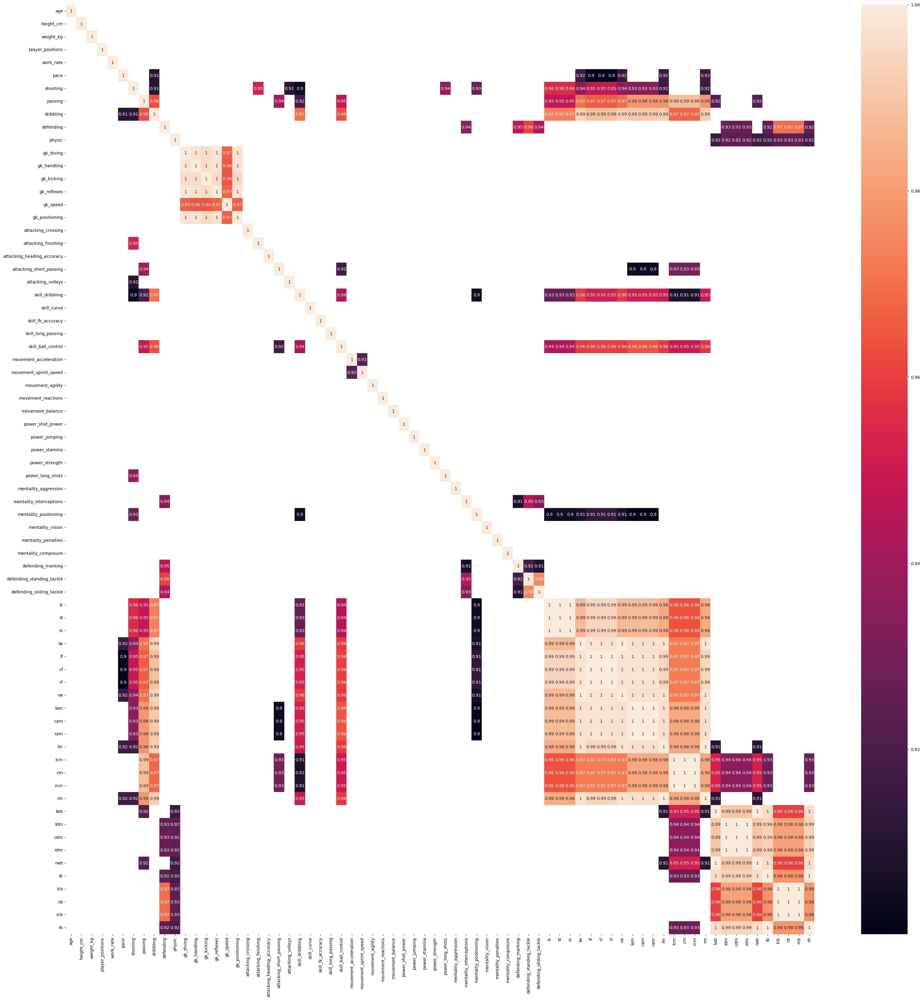

In [56]:
fifa_data_upd_scl_corr = fifa_data_upd_scl.corr()
plt.figure(figsize=(40,40))
sns.heatmap(fifa_data_upd_scl_corr[fifa_data_upd_scl_corr > 0.90], annot=True)
plt.show()

#### Insights:
* there are many features which are correlated but removing them will result in data loss, hence no features are removing from this method

In [122]:
pip install fast_ml

In [123]:
#Duplicate features
from fast_ml.utilities import display_all
from fast_ml.feature_selection import get_duplicate_features

get_duplicate_features(fifa_data_upd_scl)

,Desc,feature1,feature2
0,Duplicate Values,ls,st
1,Duplicate Values,ls,rs
2,Duplicate Values,lw,rw
3,Duplicate Values,lf,cf
4,Duplicate Values,lf,rf
5,Duplicate Values,lam,cam
6,Duplicate Values,lam,ram
7,Duplicate Values,lm,rm
8,Duplicate Values,lcm,cm
9,Duplicate Values,lcm,rcm


#### Insights:
* Features ls, lw, lf, lam, lm, lcm, lwb, ldm, lb, lcb listed in feature1 are the features to be considered
* Features listed in feature2 are to be deleted

In [71]:
fifa_data_upd_scl_cols_del = ['st', 'rs', 'rw', 'cf', 'rf', 'cam', 'ram', 'rm',
                             'cm', 'rcm', 'rwb', 'cdm', 'rdm', 'rb', 'cb', 'rcb']

In [72]:
fifa_data_upd_scl_upd = fifa_data_upd_scl.drop(fifa_data_upd_scl_cols_del, axis=1)

In [73]:
fifa_data_upd_scl_upd

,age,height_cm,weight_kg,player_positions,work_rate,pace,shooting,passing,dribbling,defending,...,ls,lw,lf,lam,lm,lcm,lwb,ldm,lb,lcb
0,1.442333,-1.681598,-0.464891,1.433033,0.415506,1.127098,2.156700,2.006332,1.843560,-0.303796,...,1.823542,1.905263,1.926804,1.911920,1.835064,1.712003,0.837146,0.758242,0.624557,0.137041
1,1.871809,0.834394,1.095935,1.822451,-1.691770,1.253076,2.204072,1.518666,1.524399,-0.482213,...,1.968237,1.764831,1.832760,1.724170,1.694257,1.470541,0.739820,0.566184,0.575939,0.231240
2,0.368643,-0.941600,-1.032464,0.408248,-1.340558,1.295069,1.825099,1.762499,1.797965,-0.616026,...,1.630615,1.811641,1.785738,1.818045,1.741193,1.518833,0.788483,0.566184,0.575939,-0.098456
3,0.153905,0.982394,1.663508,-0.196375,0.766719,-2.526264,-2.201490,-2.480193,-2.533508,-2.043363,...,-2.565541,-2.541747,-2.540294,-2.547158,-2.576875,-2.586022,-2.569266,-2.506745,-2.535613,-2.406321
4,0.583381,-0.941600,-0.181104,0.438991,-1.340558,1.295069,1.730355,1.713733,1.752371,-0.482213,...,1.582383,1.764831,1.738716,1.771107,1.741193,1.567125,0.788483,0.662213,0.575939,0.042842
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18273,-0.705048,0.686395,0.528362,-1.072567,0.064294,-0.132682,-1.111943,-1.114729,-1.028891,0.053038,...,-0.925664,-0.996996,-0.988565,-0.998215,-0.934132,-0.895787,-0.379429,-0.394106,-0.250567,-0.145555
18274,-0.705048,-0.645601,-1.316251,-1.072567,0.766719,-0.090689,-1.064571,-0.870896,-0.937702,0.097642,...,-0.877432,-0.903375,-0.941543,-0.904340,-0.840261,-0.750910,-0.330766,-0.346092,-0.201949,-0.098456
18275,-1.349262,0.686395,-0.039211,-0.560174,-0.286919,-0.258660,-0.543483,-0.334464,-0.481758,0.097642,...,-0.395116,-0.435269,-0.424300,-0.388025,-0.370906,-0.267986,-0.184777,-0.058005,-0.153331,-0.004257
18276,-1.564000,0.538395,-0.181104,-0.560174,-0.638132,-0.048697,-0.543483,-0.188164,-0.390569,-0.036171,...,-0.395116,-0.341647,-0.377278,-0.294150,-0.323970,-0.267986,-0.136114,-0.106019,-0.104713,-0.004257


### Feature Extraction

#### PCA - Principle Component Analysis

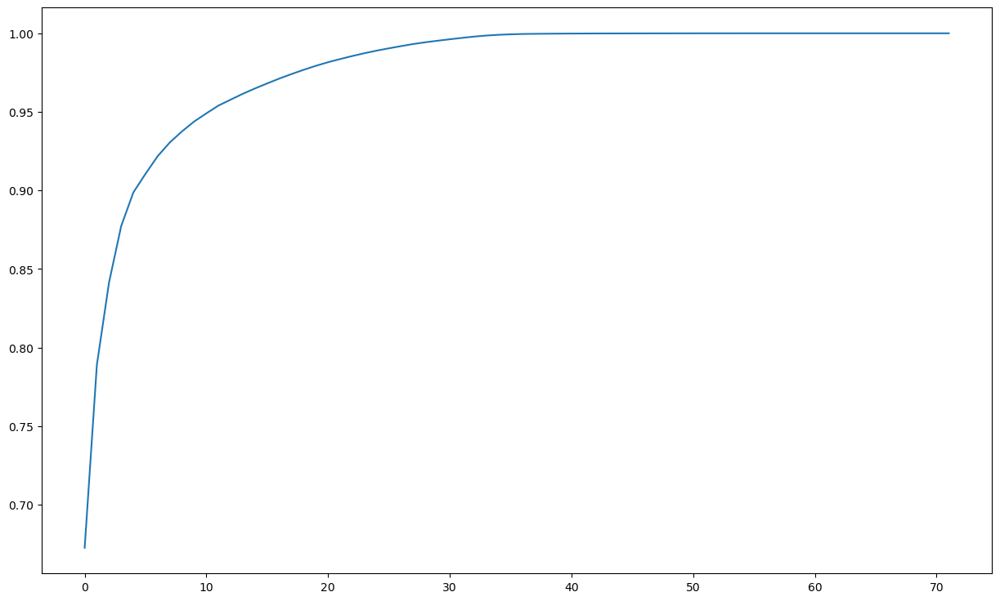

In [74]:
from sklearn.decomposition import PCA

pca=PCA()
pri_comps = pca.fit_transform(fifa_data_upd_scl)

plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.show()

#### Insights:
*  10 principal components explain around 95% of the data. n_components can be taken as 10

In [75]:
pca_upd = PCA(n_components=5)
pri_comps_upd = pca_upd.fit_transform(fifa_data_upd_scl)

fifa_data_pca = pd.DataFrame(data=pri_comps_upd, columns = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5'])

In [76]:
fifa_data_pca

,PC1,PC2,PC3,PC4,PC5
0,-11.250230,-6.517064,4.165158,-2.386596,-0.098354
1,-10.435295,-5.436475,6.104904,0.980819,-2.668380
2,-10.171391,-6.843206,2.849159,-2.423066,-0.098326
3,17.467432,-1.112747,5.050347,-3.586795,-3.235632
4,-10.108588,-6.127347,3.120681,-1.953756,-0.310091
...,...,...,...,...,...
18273,5.673189,2.897811,-3.898891,1.362124,-0.164124
18274,5.041140,2.483996,-4.880404,0.073917,0.243579
18275,2.712902,1.714499,-2.474686,0.958952,1.236255
18276,2.352175,1.390146,-2.461834,0.672817,0.914373


### Model selection and creation

#### Task 2: Explore football skills and cluster football players based on their attributes 

#### 1) KMeans clustering:

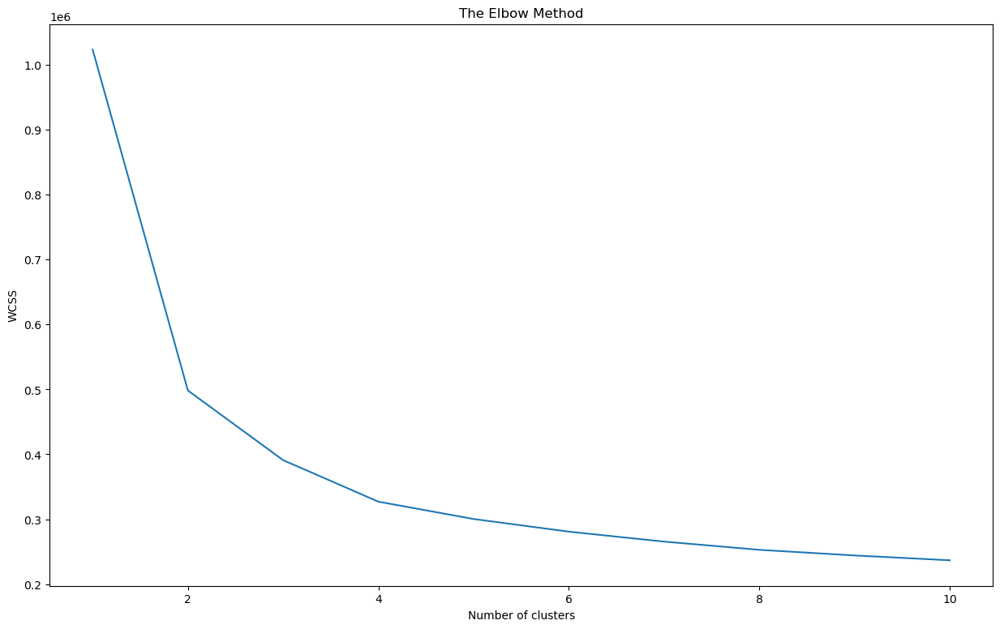

In [77]:
from sklearn.cluster import KMeans
wcss=[]
for i in range (1,11):
    kmeans=KMeans(n_clusters=i,random_state=42)
    kmeans.fit(fifa_data_upd_scl_upd)
    wcss.append(kmeans.inertia_)
plt.plot(range(1,11),wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS') #for duplicate feature
plt.show()

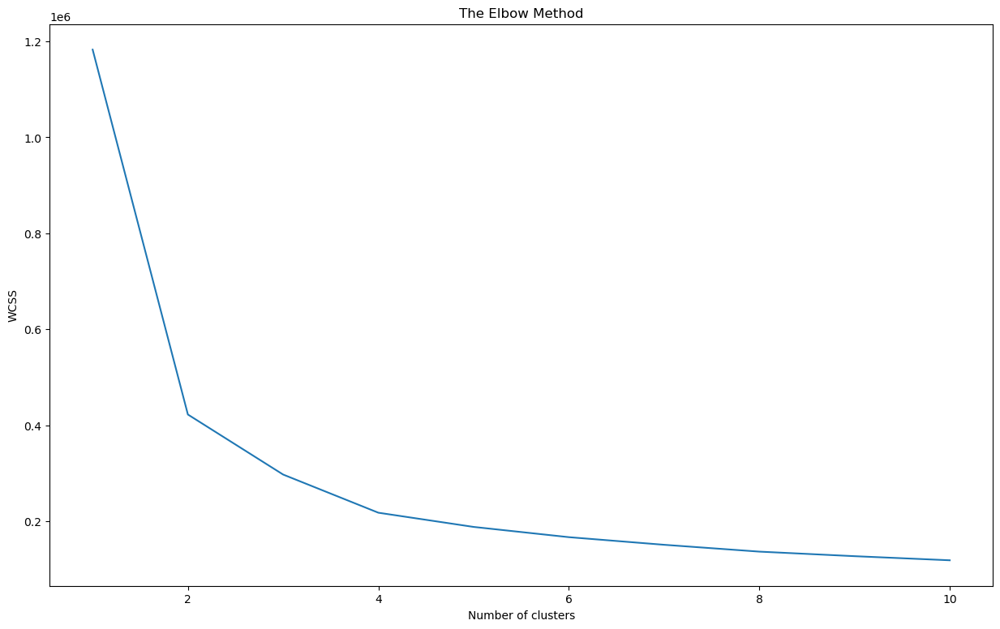

In [78]:
from sklearn.cluster import KMeans
wcss=[]
for i in range (1,11):
    kmeans=KMeans(n_clusters=i,random_state=42)
    kmeans.fit(fifa_data_pca)
    wcss.append(kmeans.inertia_)
plt.plot(range(1,11),wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS') #for PCA
plt.show()

#### Insights:
* The elbow method shows that the cluster size to be selected is 4. However, let us create model with cluster size 2 to 5 to analyse and confirm

In [79]:
#creating the model with cluster size 2 to 5
# For 2 clusters
kmea_clu_dup_fea_clu2 = KMeans(n_clusters=2, random_state=9)
kmea_clu_dup_fea_clu2.fit(fifa_data_upd_scl_upd)
print("WCSS for dup fea with 2 clusters:", kmea_clu_dup_fea_clu2.inertia_)

# For 3 clusters
kmea_clu_dup_fea_clu3 = KMeans(n_clusters=3, random_state=9)
kmea_clu_dup_fea_clu3.fit(fifa_data_upd_scl_upd)
print("WCSS for dup fea with 3 clusters:", kmea_clu_dup_fea_clu3.inertia_)

# For 4 clusters
kmea_clu_dup_fea_clu4 = KMeans(n_clusters=4, random_state=9)
kmea_clu_dup_fea_clu4.fit(fifa_data_upd_scl_upd)
print("WCSS for dup fea with 4 clusters:", kmea_clu_dup_fea_clu4.inertia_)

# For 5 clusters
kmea_clu_dup_fea_clu5 = KMeans(n_clusters=5, random_state=9)
kmea_clu_dup_fea_clu5.fit(fifa_data_upd_scl_upd)
print("WCSS for dup fea with 5 clusters:", kmea_clu_dup_fea_clu5.inertia_)

WCSS for dup fea with 2 clusters: 498308.92890936707
WCSS for dup fea with 3 clusters: 390964.3878017435
WCSS for dup fea with 4 clusters: 326981.2326894152
WCSS for dup fea with 5 clusters: 300272.7511419966


In [80]:
# For 2 clusters
kmea_clu_pca_clu2 = KMeans(n_clusters=2, random_state=9)
kmea_clu_pca_clu2.fit(fifa_data_pca)
print("WCSS for pca with 2 clusters:", kmea_clu_pca_clu2.inertia_)

# For 3 clusters
kmea_clu_pca_clu3 = KMeans(n_clusters=3, random_state=9)
kmea_clu_pca_clu3.fit(fifa_data_pca)
print("WCSS for pca with 3 clusters:", kmea_clu_pca_clu3.inertia_)

# For 4 clusters
kmea_clu_pca_clu4 = KMeans(n_clusters=4, random_state=9)
kmea_clu_pca_clu4.fit(fifa_data_pca)
print("WCSS for pca with 4 clusters:", kmea_clu_pca_clu4.inertia_)

# For 5 clusters
kmea_clu_pca_clu5 = KMeans(n_clusters=5, random_state=9)
kmea_clu_pca_clu5.fit(fifa_data_pca)
print("WCSS for pca with 5 clusters:", kmea_clu_pca_clu5.inertia_)

WCSS for pca with 2 clusters: 422295.0974443994
WCSS for pca with 3 clusters: 297200.8011429375
WCSS for pca with 4 clusters: 217655.37096702756
WCSS for pca with 5 clusters: 188058.6834040661


In [81]:
#extracting the labels from various cluster
# For dataframe "fifa_data_upd_scl_upd"

kmea_clu_dup_fea_clu2_labels = kmea_clu_dup_fea_clu2.labels_
kmea_clu_dup_fea_clu3_labels = kmea_clu_dup_fea_clu3.labels_
kmea_clu_dup_fea_clu4_labels = kmea_clu_dup_fea_clu4.labels_
kmea_clu_dup_fea_clu5_labels = kmea_clu_dup_fea_clu5.labels_

# For dataframe "fifa_data_pca

kmea_clu_pca_clu2_labels = kmea_clu_pca_clu2.labels_
kmea_clu_pca_clu3_labels = kmea_clu_pca_clu3.labels_
kmea_clu_pca_clu4_labels = kmea_clu_pca_clu4.labels_
kmea_clu_pca_clu5_labels = kmea_clu_pca_clu5.labels_

#### Hierarchical clustering 

In [82]:
#creating the model
from sklearn.cluster import AgglomerativeClustering

hie_clu_dup_fea_clun = AgglomerativeClustering(n_clusters=None, distance_threshold=0)
hie_clu_dup_fea_clun_labels = hie_clu_dup_fea_clun.fit_predict(fifa_data_upd_scl_upd)

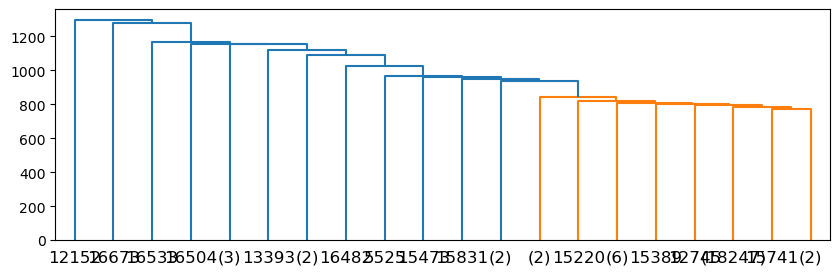

In [83]:
#visualise the dendogram
from scipy.cluster import hierarchy
from scipy.cluster.hierarchy import dendrogram

linkage_matrix = hierarchy.linkage(hie_clu_dup_fea_clun.children_)
plt.figure(figsize=(10,3))
dendro = dendrogram(linkage_matrix, truncate_mode="lastp", p=20)


#### Insights:
* we could see 2 large branches on the left hand side indicating that 2 clusters are possible

### Model Evaluation

**Graphical analysis of model created via features extracted via Duplicated features method** 

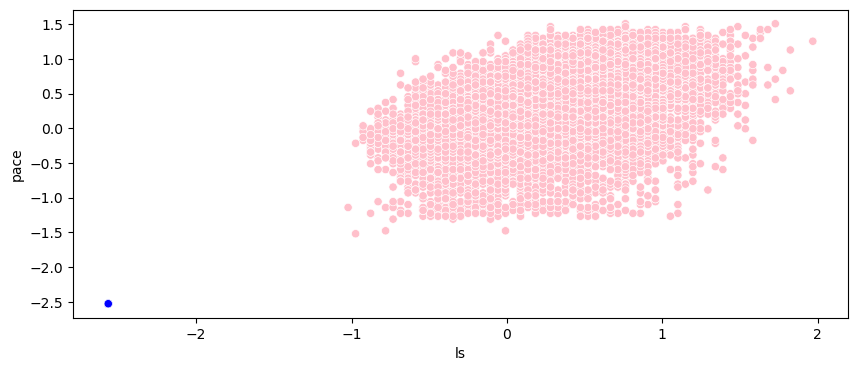

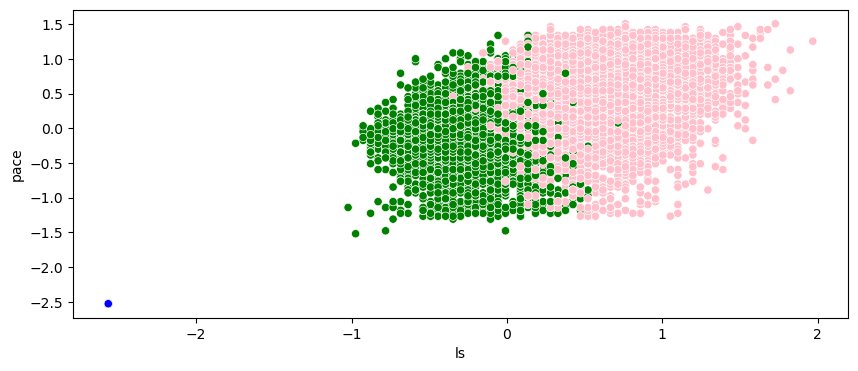

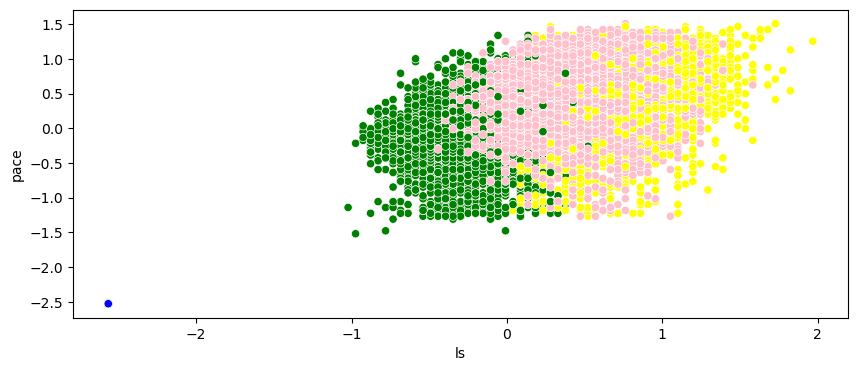

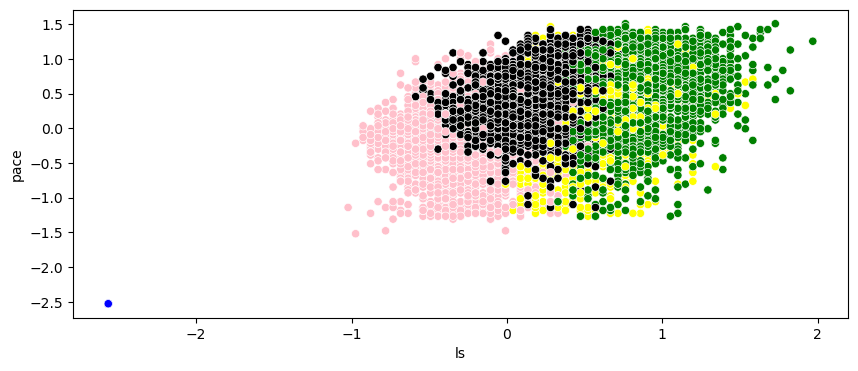

In [84]:
#Striker vs Pace skills(for clusters 2 to 5

color_scheme = np.array(["pink", "blue", "green", "yellow", "black"])

plt.figure(figsize=(10,4))
sns.scatterplot(x="ls", y="pace", data=fifa_data_upd_scl_upd, color=color_scheme[kmea_clu_dup_fea_clu2_labels])
plt.show()

plt.figure(figsize=(10,4))
sns.scatterplot(x="ls", y="pace", data=fifa_data_upd_scl_upd, color=color_scheme[kmea_clu_dup_fea_clu3_labels])
plt.show()

plt.figure(figsize=(10,4))
sns.scatterplot(x="ls", y="pace", data=fifa_data_upd_scl_upd, color=color_scheme[kmea_clu_dup_fea_clu4_labels])
plt.show()

plt.figure(figsize=(10,4))
sns.scatterplot(x="ls", y="pace", data=fifa_data_upd_scl_upd, color=color_scheme[kmea_clu_dup_fea_clu5_labels])
plt.show()

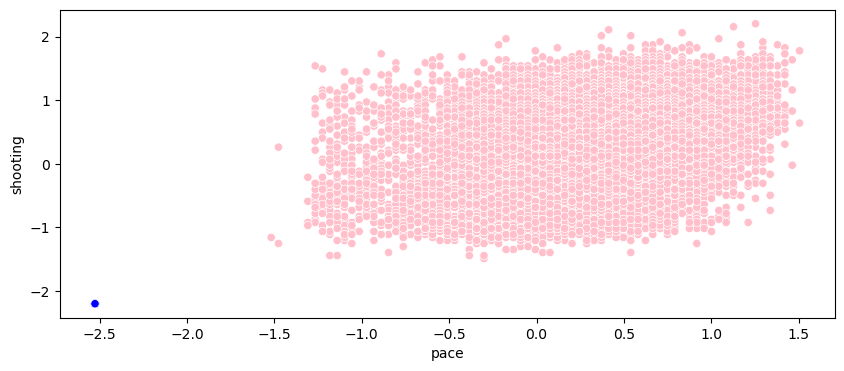

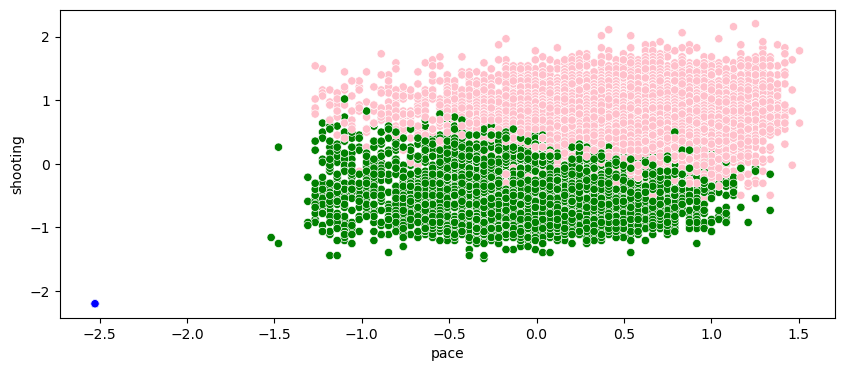

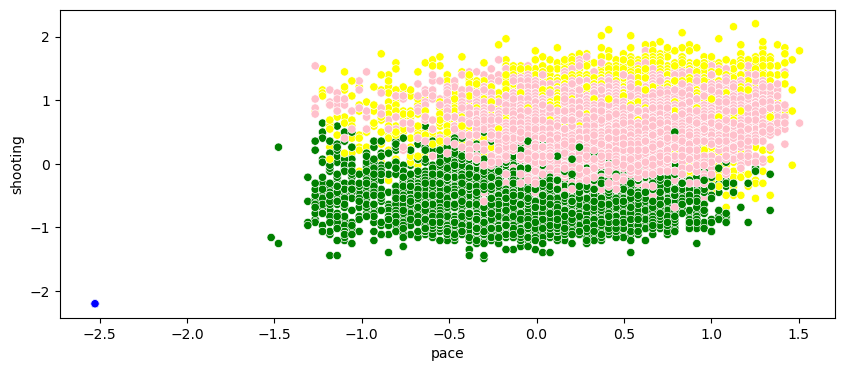

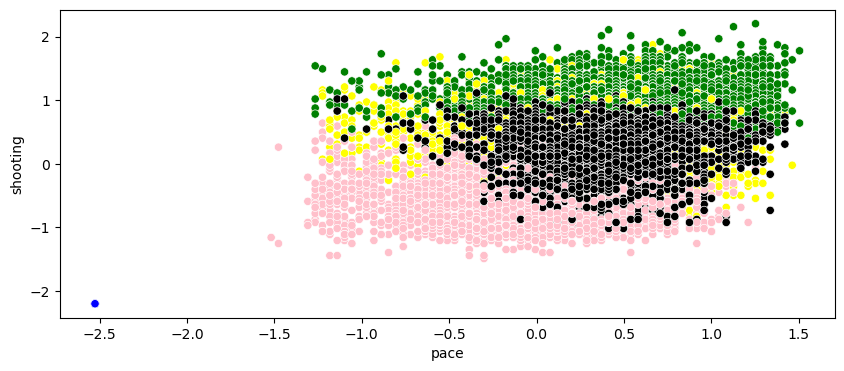

In [85]:
# Pace vs Shooting skills(for clusters 2 to 5)

plt.figure(figsize=(10,4))
sns.scatterplot(x="pace", y="shooting", data=fifa_data_upd_scl_upd, color=color_scheme[kmea_clu_dup_fea_clu2_labels])
plt.show()

plt.figure(figsize=(10,4))
sns.scatterplot(x="pace", y="shooting", data=fifa_data_upd_scl_upd, color=color_scheme[kmea_clu_dup_fea_clu3_labels])
plt.show()

plt.figure(figsize=(10,4))
sns.scatterplot(x="pace", y="shooting", data=fifa_data_upd_scl_upd, color=color_scheme[kmea_clu_dup_fea_clu4_labels])
plt.show()

plt.figure(figsize=(10,4))
sns.scatterplot(x="pace", y="shooting", data=fifa_data_upd_scl_upd, color=color_scheme[kmea_clu_dup_fea_clu5_labels])
plt.show()

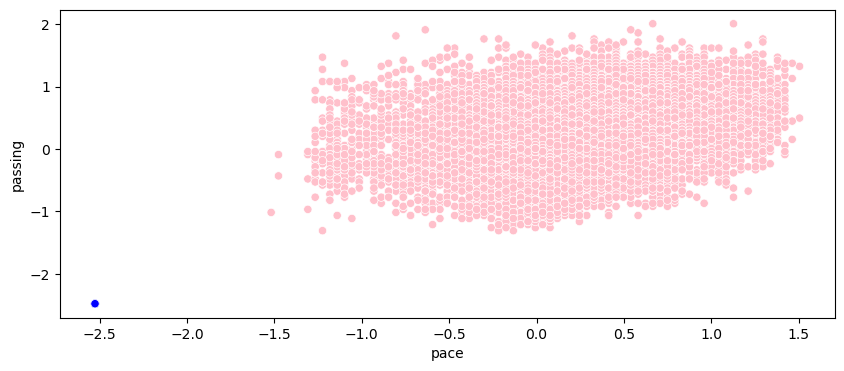

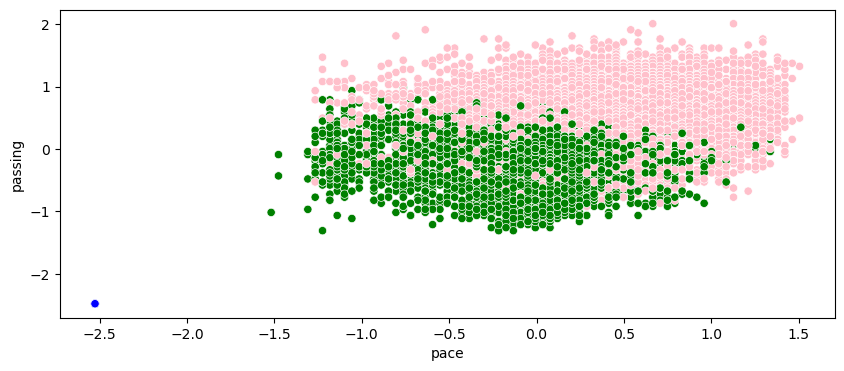

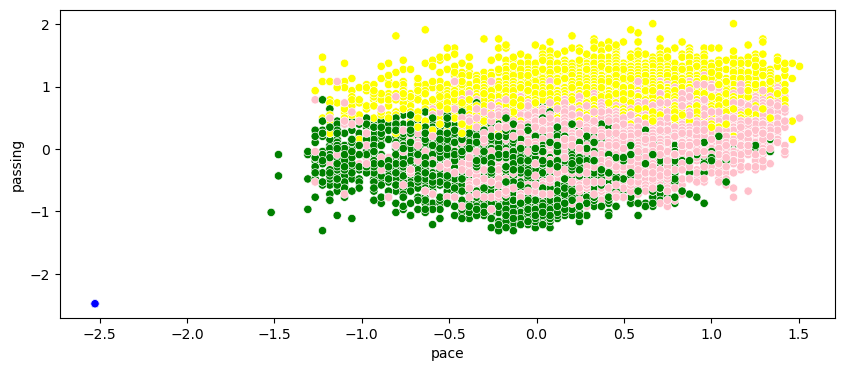

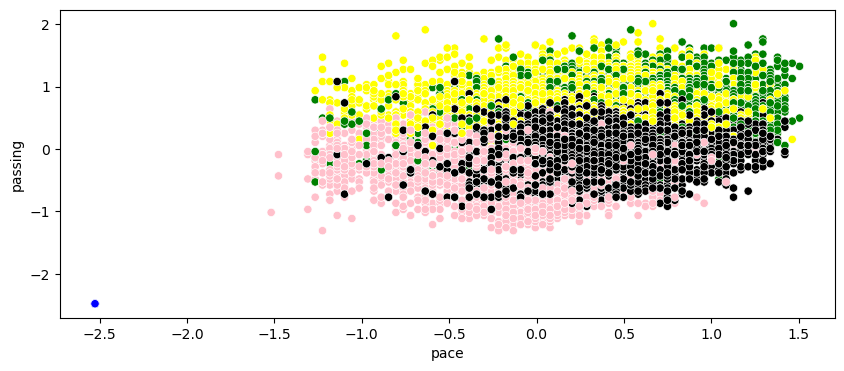

In [86]:
# Pace vs Passing skills(for clusters 2 to 5)

plt.figure(figsize=(10,4))
sns.scatterplot(x="pace", y="passing", data=fifa_data_upd_scl_upd, color=color_scheme[kmea_clu_dup_fea_clu2_labels])
plt.show()

plt.figure(figsize=(10,4))
sns.scatterplot(x="pace", y="passing", data=fifa_data_upd_scl_upd, color=color_scheme[kmea_clu_dup_fea_clu3_labels])
plt.show()

plt.figure(figsize=(10,4))
sns.scatterplot(x="pace", y="passing", data=fifa_data_upd_scl_upd, color=color_scheme[kmea_clu_dup_fea_clu4_labels])
plt.show()

plt.figure(figsize=(10,4))
sns.scatterplot(x="pace", y="passing", data=fifa_data_upd_scl_upd, color=color_scheme[kmea_clu_dup_fea_clu5_labels])
plt.show()

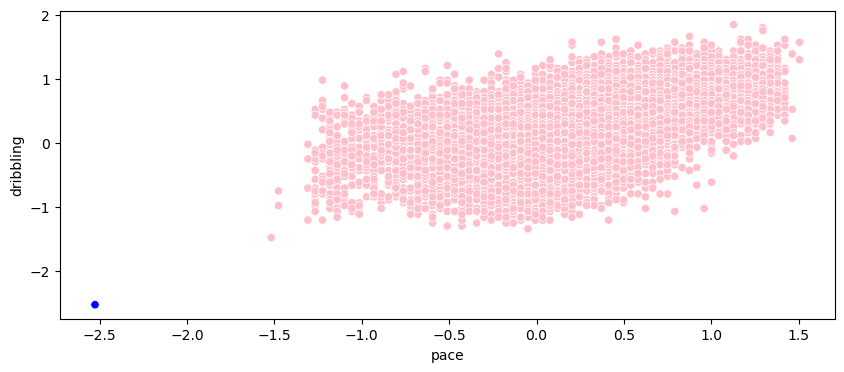

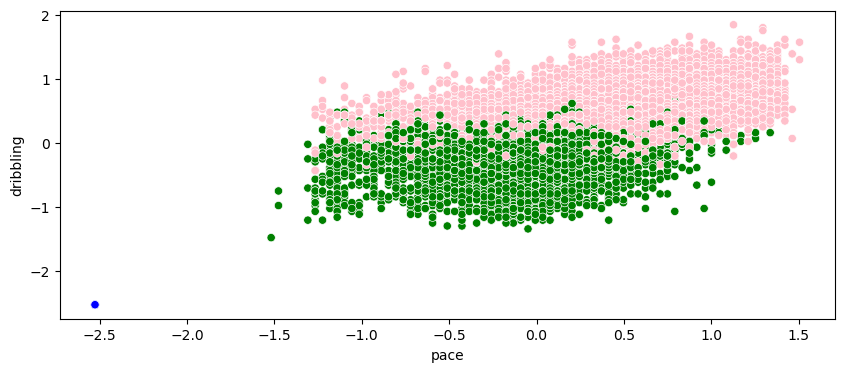

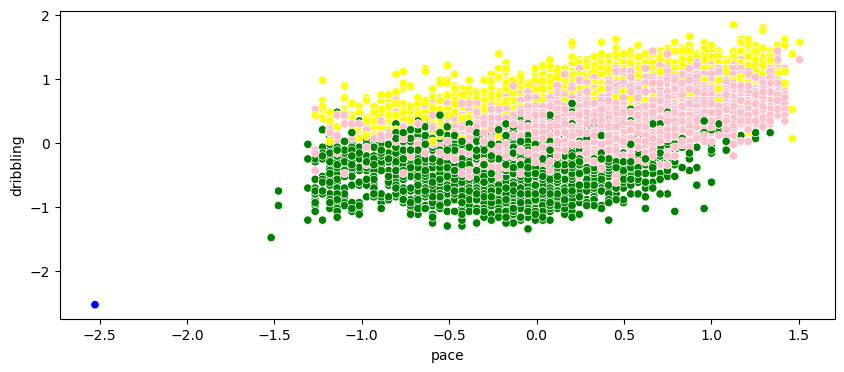

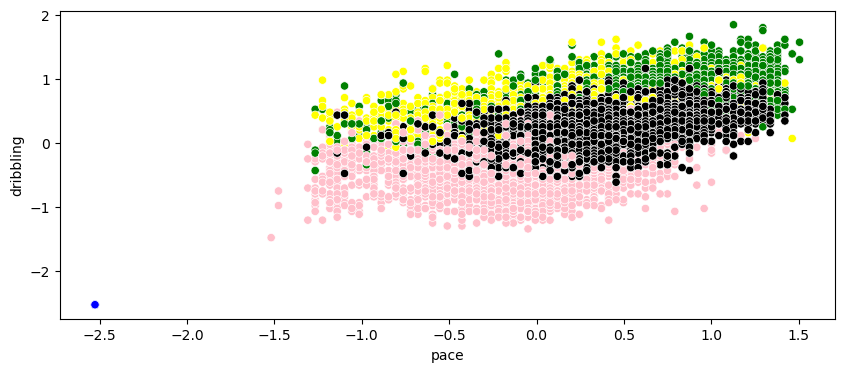

In [87]:
#Pace vs Dribbling skills(for clusters 2 to 5)

plt.figure(figsize=(10,4))
sns.scatterplot(x="pace", y="dribbling", data=fifa_data_upd_scl_upd, color=color_scheme[kmea_clu_dup_fea_clu2_labels])
plt.show()

plt.figure(figsize=(10,4))
sns.scatterplot(x="pace", y="dribbling", data=fifa_data_upd_scl_upd, color=color_scheme[kmea_clu_dup_fea_clu3_labels])
plt.show()

plt.figure(figsize=(10,4))
sns.scatterplot(x="pace", y="dribbling", data=fifa_data_upd_scl_upd, color=color_scheme[kmea_clu_dup_fea_clu4_labels])
plt.show()

plt.figure(figsize=(10,4))
sns.scatterplot(x="pace", y="dribbling", data=fifa_data_upd_scl_upd, color=color_scheme[kmea_clu_dup_fea_clu5_labels])
plt.show()


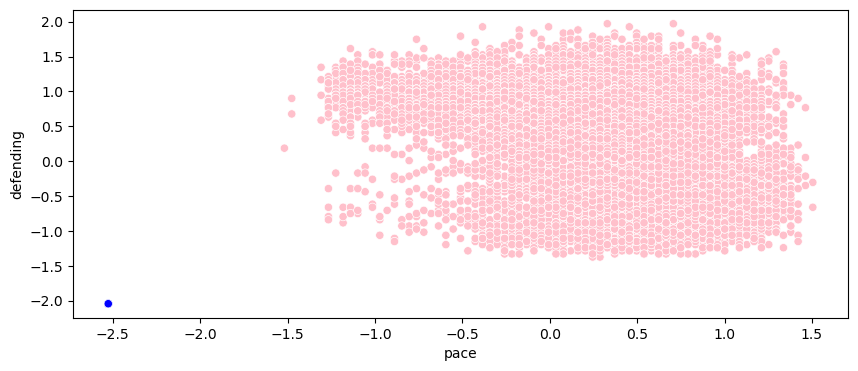

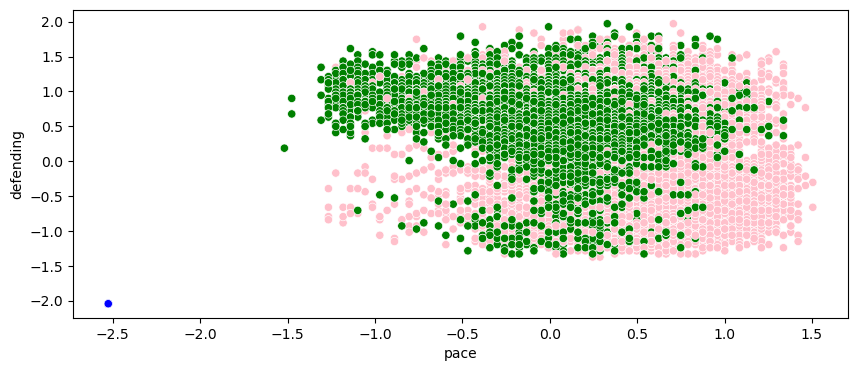

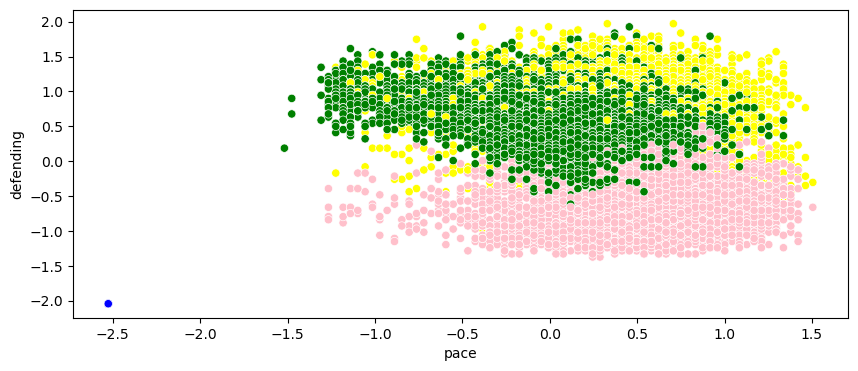

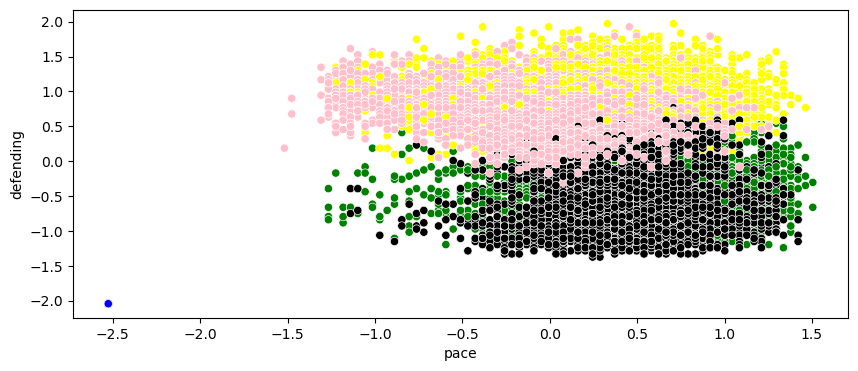

In [88]:
#Pace vs Defending skills(for clusters 2 to 5)

plt.figure(figsize=(10,4))
sns.scatterplot(x="pace", y="defending", data=fifa_data_upd_scl_upd, color=color_scheme[kmea_clu_dup_fea_clu2_labels])
plt.show()

plt.figure(figsize=(10,4))
sns.scatterplot(x="pace", y="defending", data=fifa_data_upd_scl_upd, color=color_scheme[kmea_clu_dup_fea_clu3_labels])
plt.show()

plt.figure(figsize=(10,4))
sns.scatterplot(x="pace", y="defending", data=fifa_data_upd_scl_upd, color=color_scheme[kmea_clu_dup_fea_clu4_labels])
plt.show()

plt.figure(figsize=(10,4))
sns.scatterplot(x="pace", y="defending", data=fifa_data_upd_scl_upd, color=color_scheme[kmea_clu_dup_fea_clu5_labels])
plt.show()

#### Insights:
* The 2D visualization shows good formation of clusters for cluster size 4 post which the clusters overlap

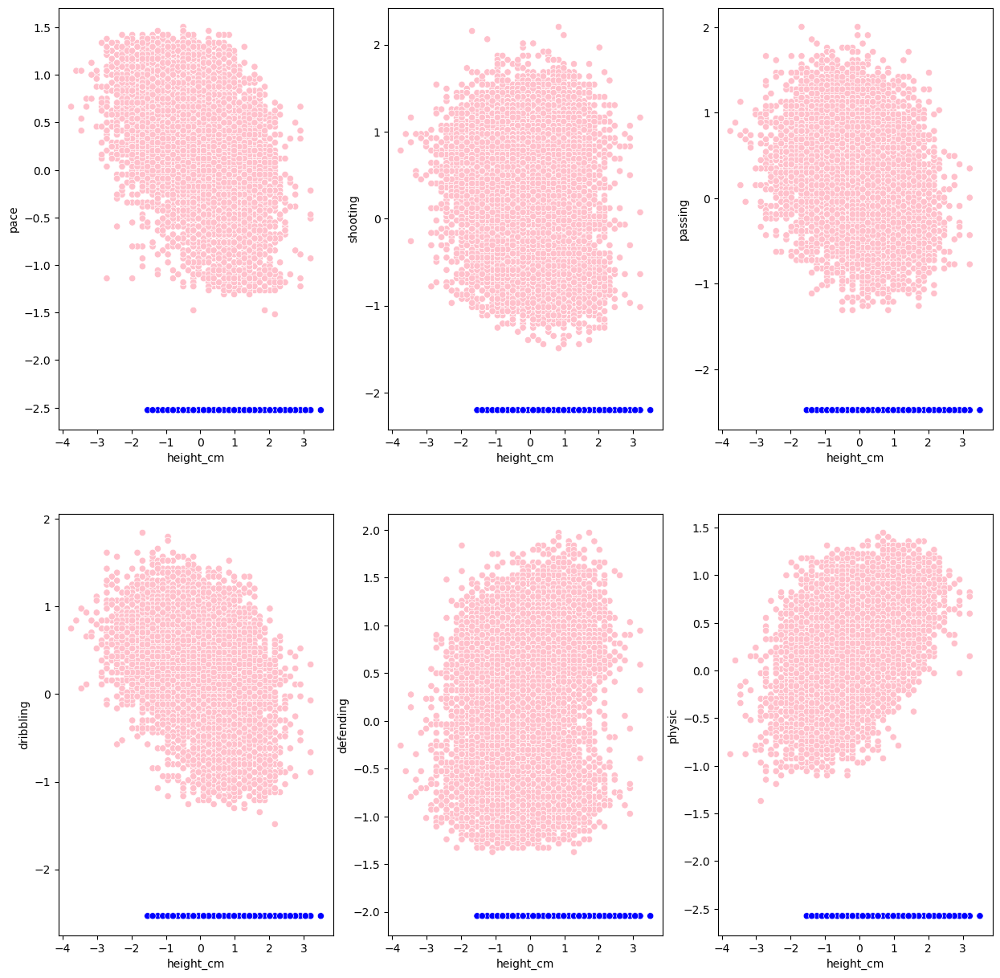

In [96]:
# Height vs few key skills(for cluster 2)

plt.figure(figsize=(15,15))
plt_num = 1

fifa_data_bivar_cols = ["pace", "shooting", "passing", "dribbling", "defending", "physic"]

for column in fifa_data_bivar_cols:
    if plt_num <= 6:
        plt.subplot(2,3,plt_num)
        sns.scatterplot(x="height_cm", y=column, data=fifa_data_upd_scl_upd, color=color_scheme[kmea_clu_dup_fea_clu2_labels])
    plt_num += 1
plt.show()

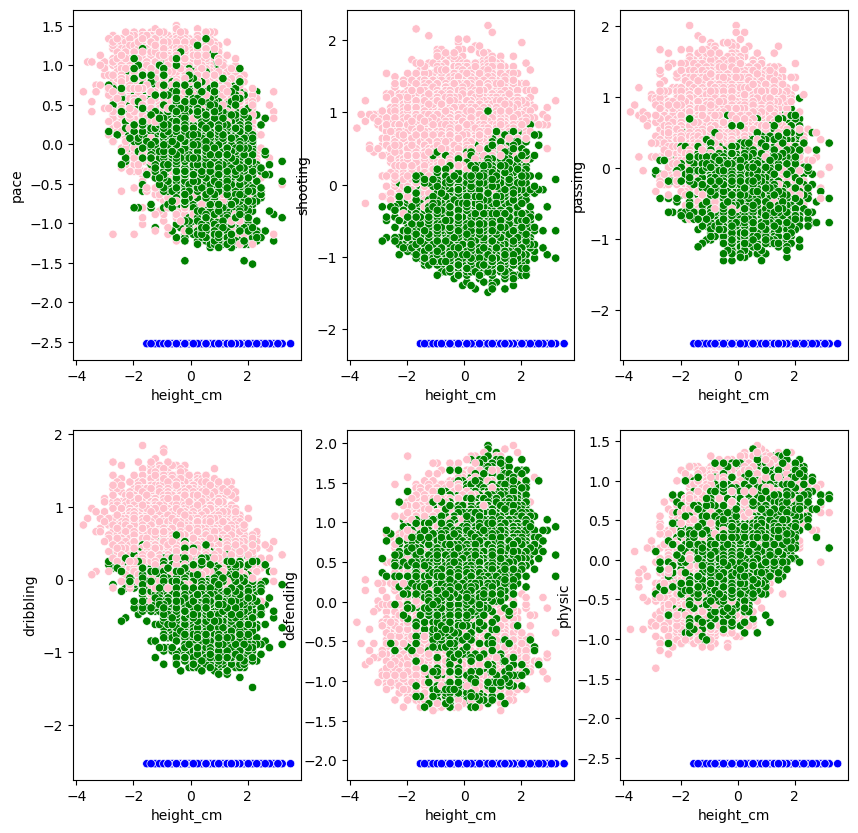

In [90]:
#Height vs few key skills(for cluster 3)
plt.figure(figsize=(10,10))
plt_num = 1

fifa_data_bivar_cols = ["pace", "shooting", "passing", "dribbling", "defending", "physic"]

for column in fifa_data_bivar_cols:
    if plt_num <= 6:
        plt.subplot(2,3,plt_num)
        sns.scatterplot(x="height_cm", y=column, data=fifa_data_upd_scl_upd, color=color_scheme[kmea_clu_dup_fea_clu3_labels])
    plt_num += 1
plt.show()


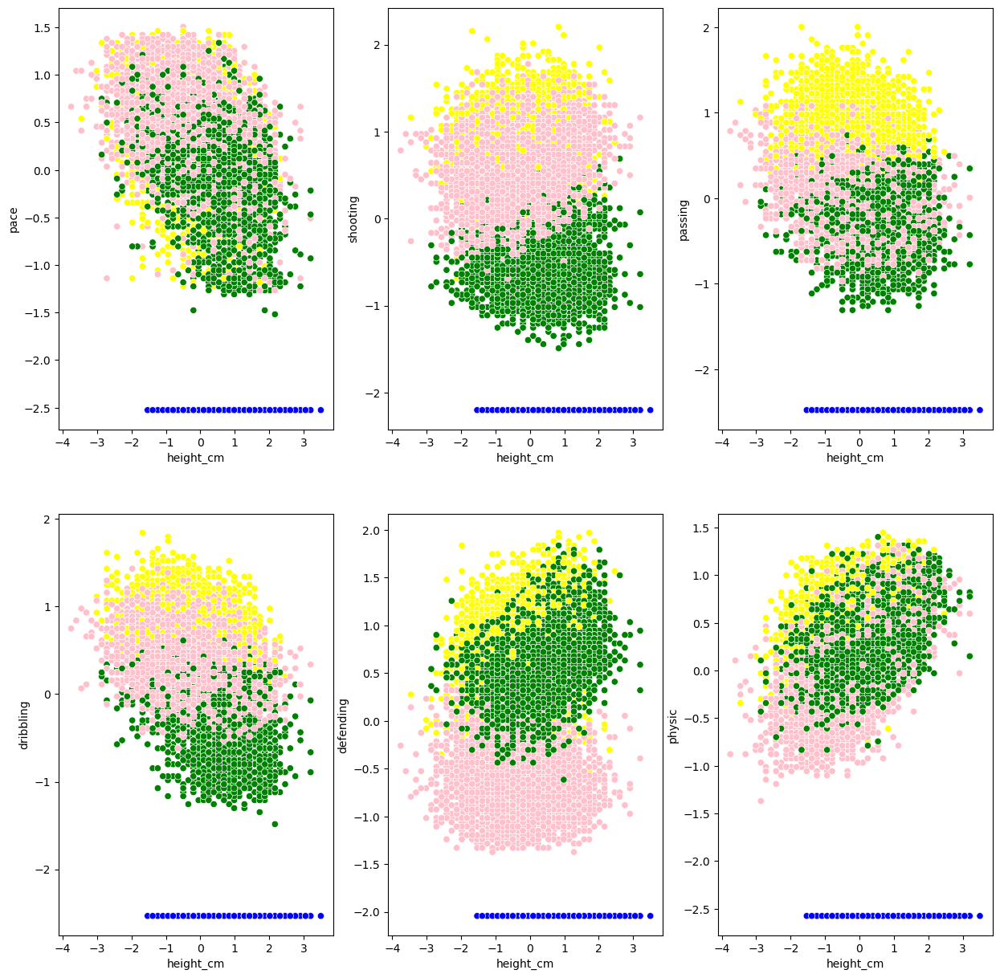

In [95]:
#Height vs few key skills(for cluster 4)

plt.figure(figsize=(15,15))
plt_num = 1

fifa_data_bivar_cols = ["pace", "shooting", "passing", "dribbling", "defending", "physic"]

for column in fifa_data_bivar_cols:
    if plt_num <= 6:
        plt.subplot(2,3,plt_num)
        sns.scatterplot(x="height_cm", y=column, data=fifa_data_upd_scl_upd, color=color_scheme[kmea_clu_dup_fea_clu4_labels])
    plt_num += 1
plt.show()

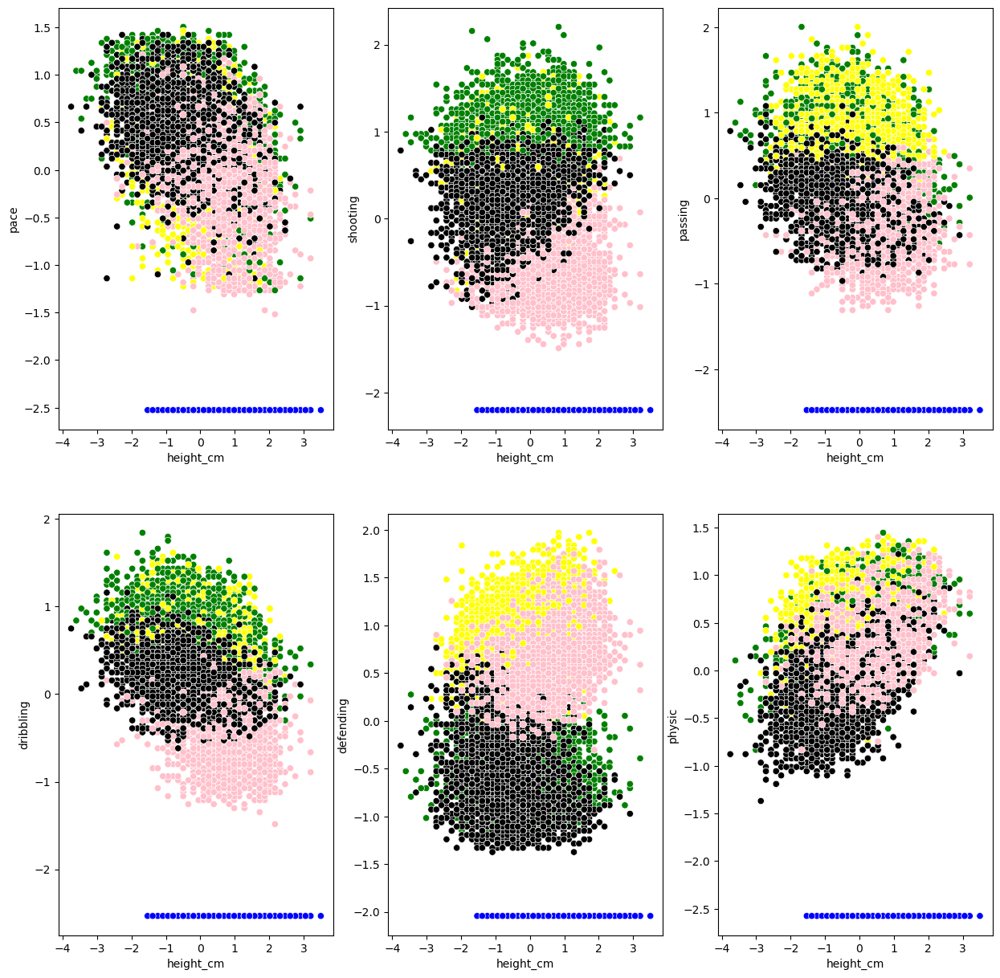

In [94]:
#Height vs few key skills(for cluster 5)

plt.figure(figsize=(15,15))
plt_num = 1

fifa_data_bivar_cols = ["pace", "shooting", "passing", "dribbling", "defending", "physic"]

for column in fifa_data_bivar_cols:
    if plt_num <= 6:
        plt.subplot(2,3,plt_num)
        sns.scatterplot(x="height_cm", y=column, data=fifa_data_upd_scl_upd, color=color_scheme[kmea_clu_dup_fea_clu5_labels])
    plt_num += 1
plt.show()

#### Insights:
* The visuals with cluster 4 seemed for form correctly post which the clusters overlap

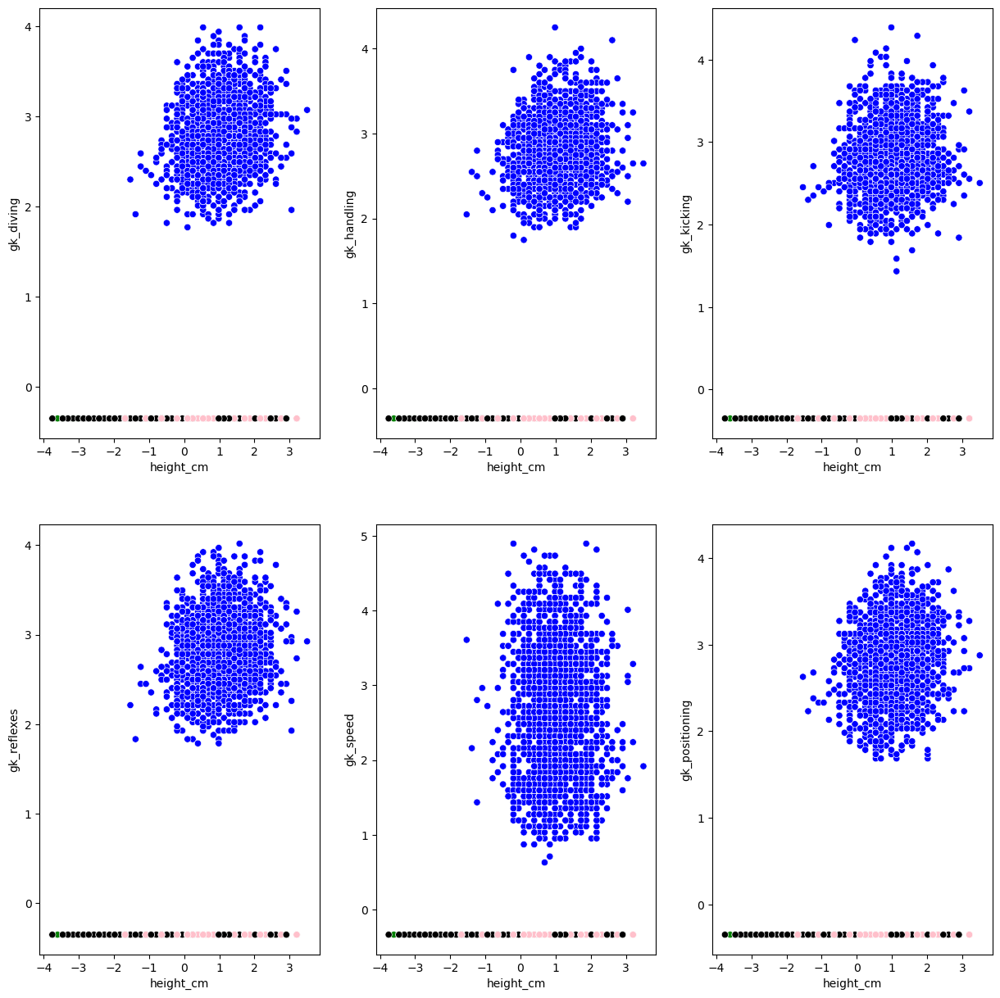

In [93]:
# Height vs Goal keeping skills(for cluster 5)
plt.figure(figsize=(15,15))
plt_num = 1

fifa_data_bivar_cols = ["gk_diving", "gk_handling", "gk_kicking", "gk_reflexes", "gk_speed", "gk_positioning"]

for column in fifa_data_bivar_cols:
    if plt_num <= 6:
        plt.subplot(2,3,plt_num)
        sns.scatterplot(x="height_cm", y=column, data=fifa_data_upd_scl_upd, color=color_scheme[kmea_clu_dup_fea_clu5_labels])
    plt_num += 1
plt.show()

#### Insights:
* This visual itself showed 1 major cluster and other clusters at the bottom. Hence, remaining clusters(2 to 4) are not analysed


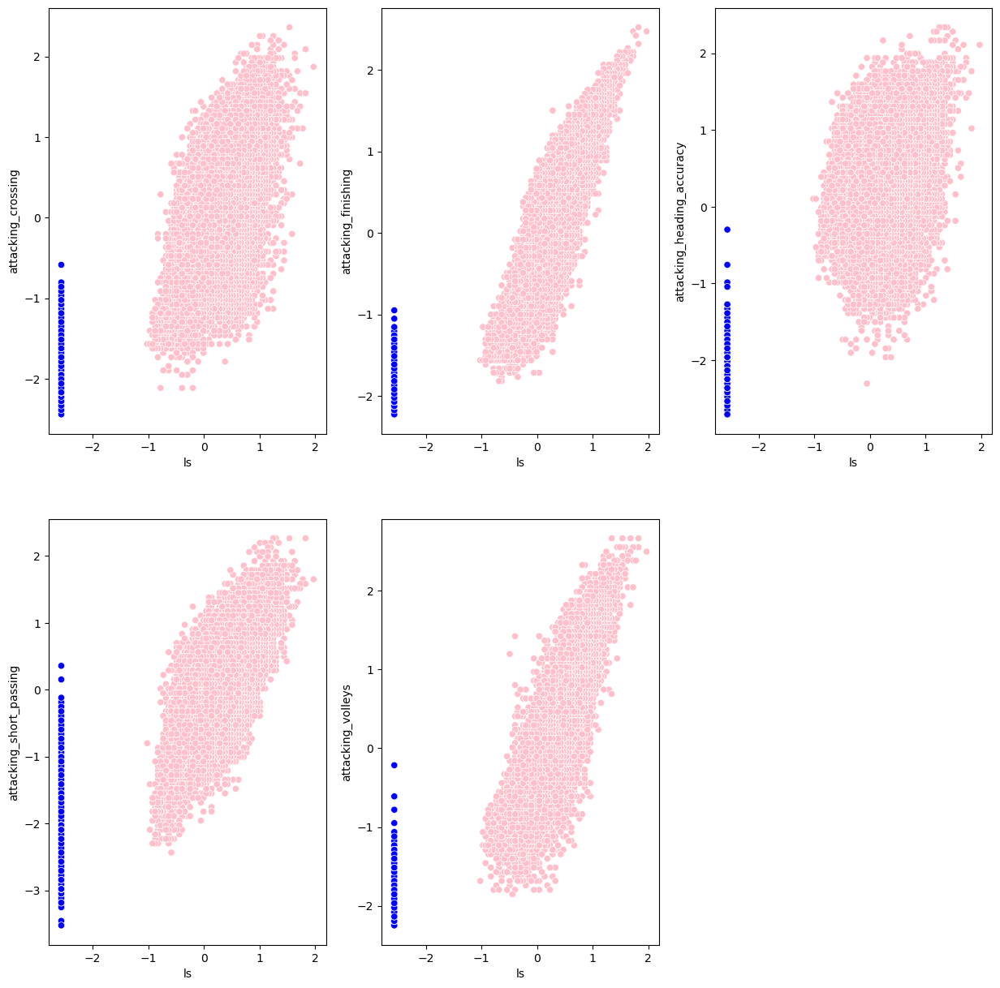

In [97]:
#Striking vs Attacking skills(for cluster 2)

plt.figure(figsize=(15,15))
plt_num = 1

fifa_data_bivar_cols = ["attacking_crossing", "attacking_finishing", "attacking_heading_accuracy",
                        "attacking_short_passing", "attacking_volleys"]

for column in fifa_data_bivar_cols:
    if plt_num <= 5:
        plt.subplot(2,3,plt_num)
        sns.scatterplot(x="ls", y=column, data=fifa_data_upd_scl_upd, color=color_scheme[kmea_clu_dup_fea_clu2_labels])
    plt_num += 1
plt.show()

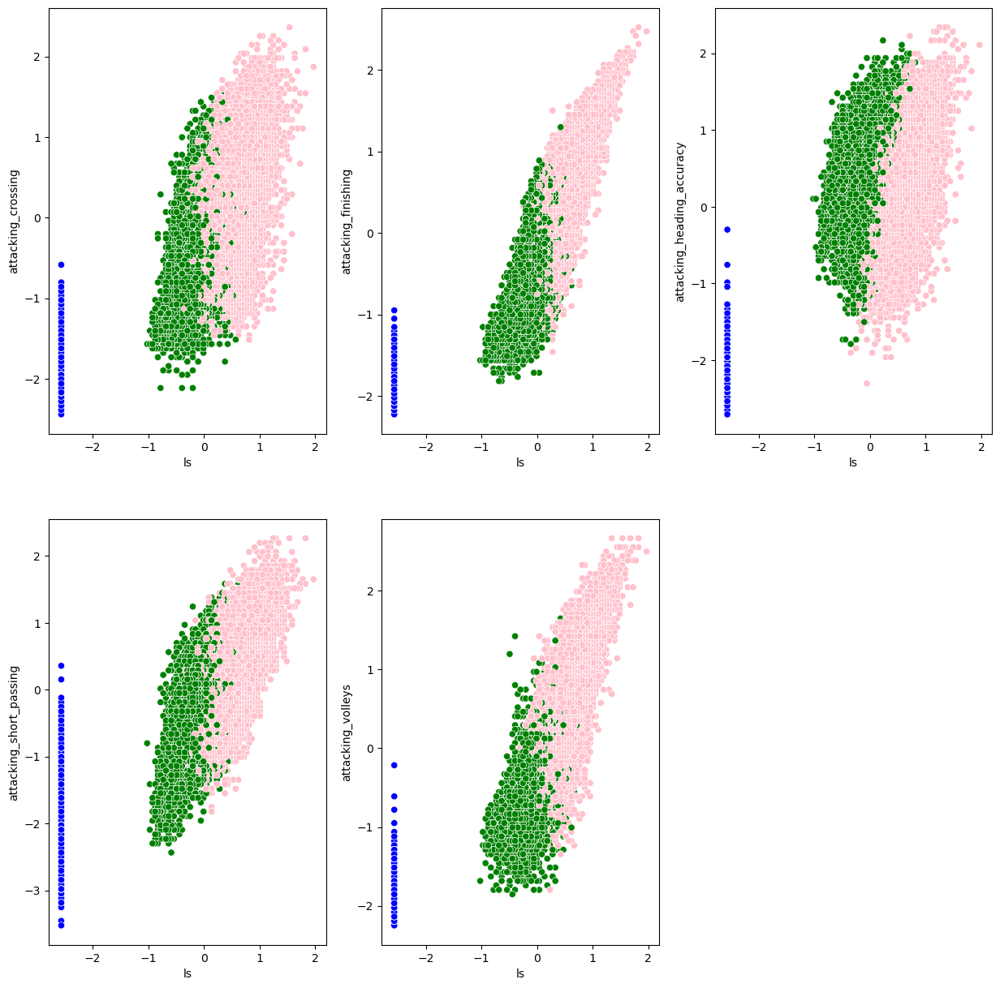

In [98]:
# Striking vs Attacking skills(for cluster 3)

plt.figure(figsize=(15,15))
plt_num = 1

fifa_data_bivar_cols = ["attacking_crossing", "attacking_finishing", "attacking_heading_accuracy",
                        "attacking_short_passing", "attacking_volleys"]

for column in fifa_data_bivar_cols:
    if plt_num <= 5:
        plt.subplot(2,3,plt_num)
        sns.scatterplot(x="ls", y=column, data=fifa_data_upd_scl_upd, color=color_scheme[kmea_clu_dup_fea_clu3_labels])
    plt_num += 1
plt.show()

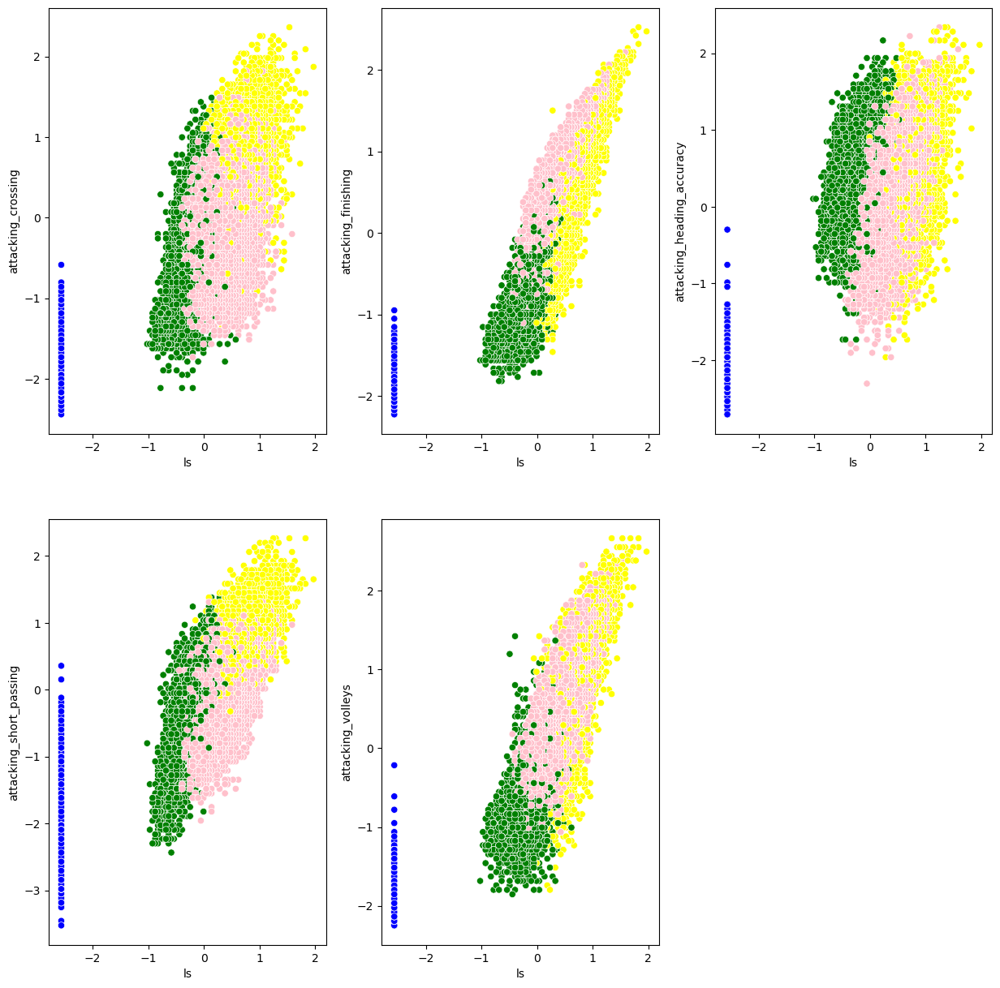

In [99]:
#Striking vs Attacking skills(for cluster 4)

plt.figure(figsize=(15,15))
plt_num = 1

fifa_data_bivar_cols = ["attacking_crossing", "attacking_finishing", "attacking_heading_accuracy",
                        "attacking_short_passing", "attacking_volleys"]

for column in fifa_data_bivar_cols:
    if plt_num <= 5:
        plt.subplot(2,3,plt_num)
        sns.scatterplot(x="ls", y=column, data=fifa_data_upd_scl_upd, color=color_scheme[kmea_clu_dup_fea_clu4_labels])
    plt_num += 1
plt.show()

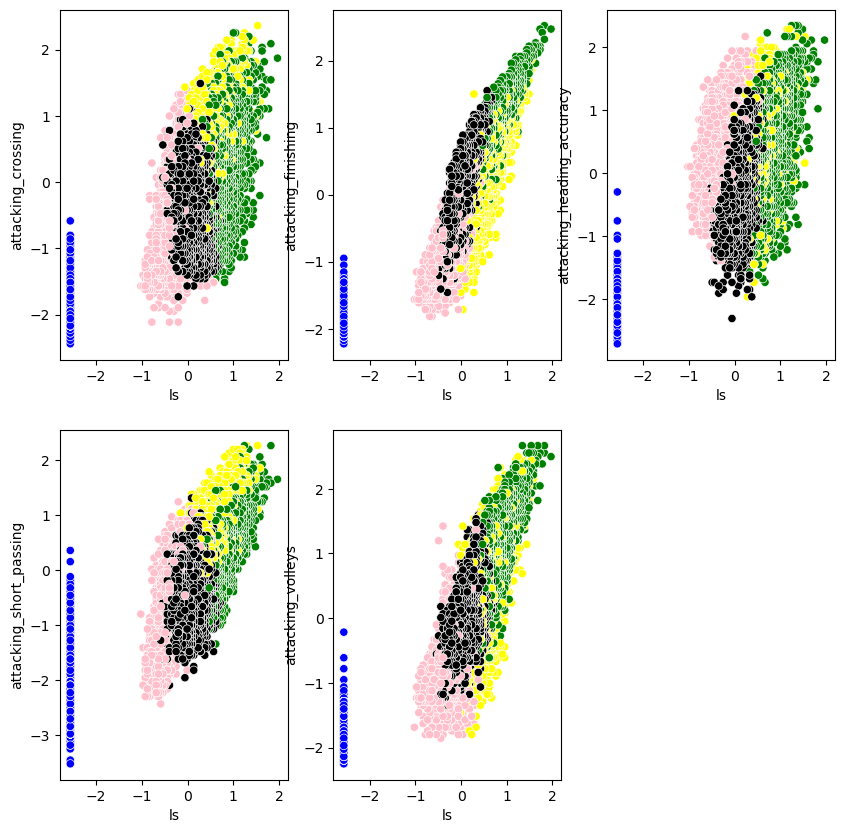

In [155]:
# Striking vs Attacking skills(for cluster 5)

plt.figure(figsize=(10,10))
plt_num = 1

fifa_data_bivar_cols = ["attacking_crossing", "attacking_finishing", "attacking_heading_accuracy",
                        "attacking_short_passing", "attacking_volleys"]

for column in fifa_data_bivar_cols:
    if plt_num <= 5:
        plt.subplot(2,3,plt_num)
        sns.scatterplot(x="ls", y=column, data=fifa_data_upd_scl_upd, color=color_scheme[kmea_clu_dup_fea_clu5_labels])
    plt_num += 1
plt.show()

#### Insights:
* The visuals form the clusters correctly for cluster size 4

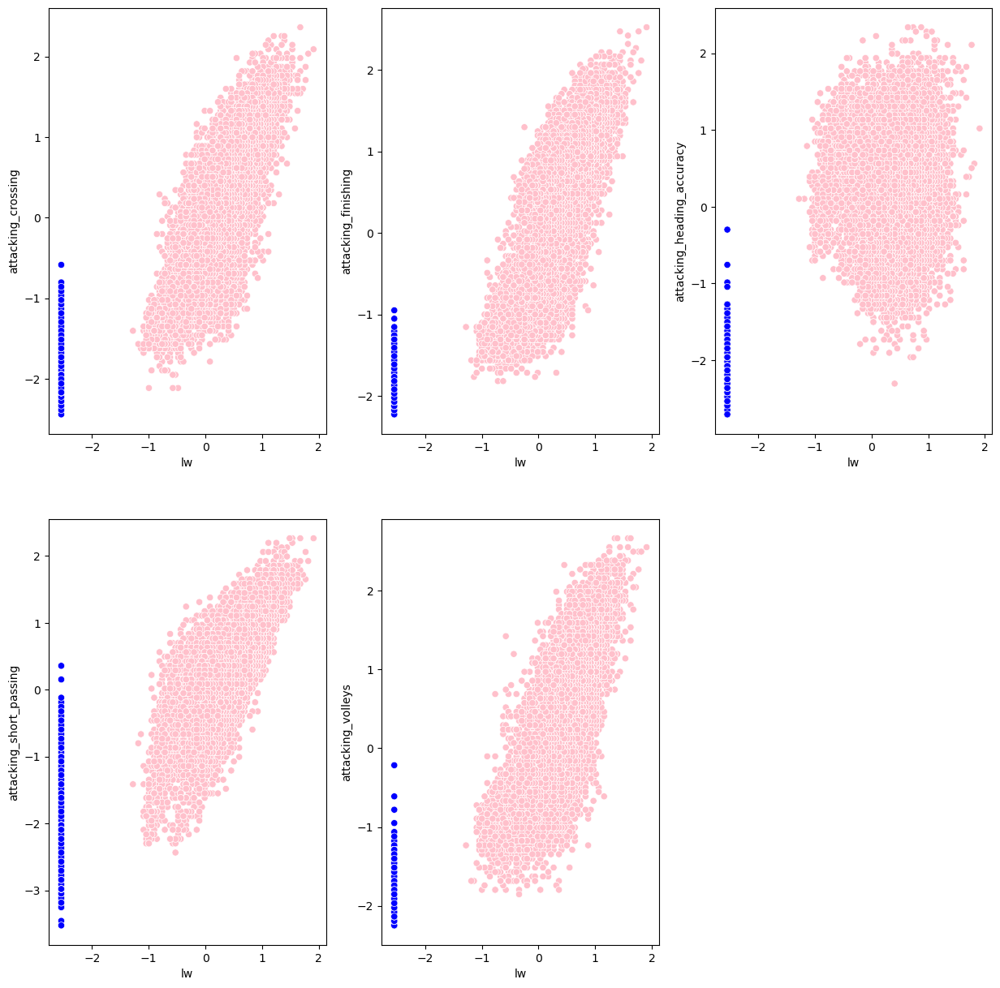

In [100]:
#Winger vs Attacking skills(for cluster 2)

plt.figure(figsize=(15,15))
plt_num = 1

fifa_data_bivar_cols = ["attacking_crossing", "attacking_finishing", "attacking_heading_accuracy",
                        "attacking_short_passing", "attacking_volleys"]

for column in fifa_data_bivar_cols:
    if plt_num <= 5:
        plt.subplot(2,3,plt_num)
        sns.scatterplot(x="lw", y=column, data=fifa_data_upd_scl_upd, color=color_scheme[kmea_clu_dup_fea_clu2_labels])
    plt_num += 1
plt.show()

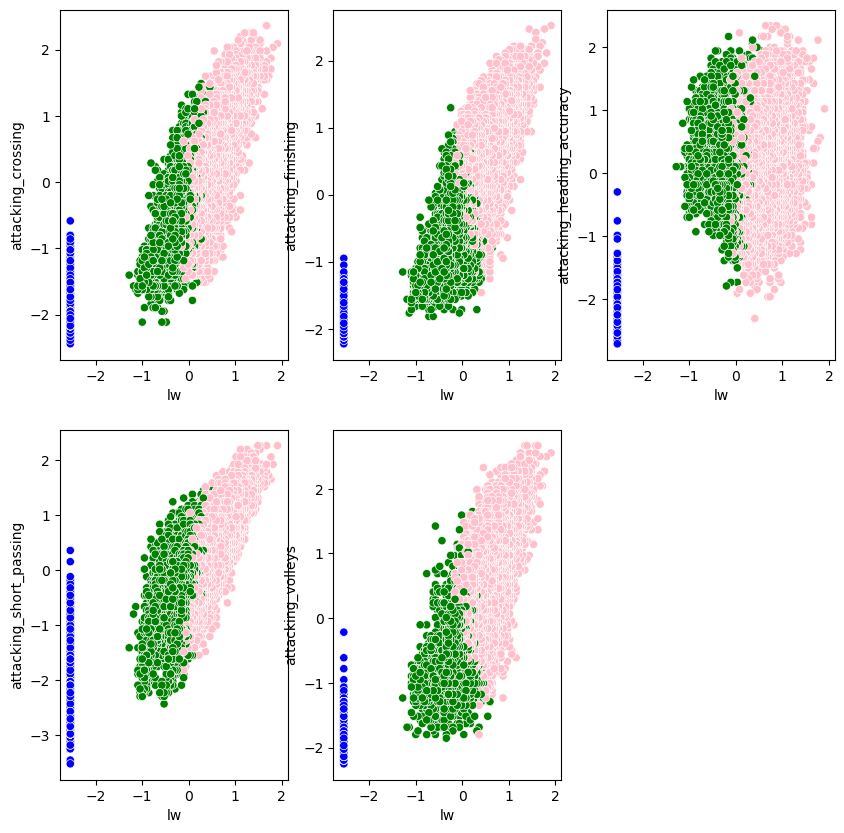

In [101]:
#Winger vs Attacking skills(for cluster 3)

plt.figure(figsize=(10,10))
plt_num = 1

fifa_data_bivar_cols = ["attacking_crossing", "attacking_finishing", "attacking_heading_accuracy",
                        "attacking_short_passing", "attacking_volleys"]

for column in fifa_data_bivar_cols:
    if plt_num <= 5:
        plt.subplot(2,3,plt_num)
        sns.scatterplot(x="lw", y=column, data=fifa_data_upd_scl_upd, color=color_scheme[kmea_clu_dup_fea_clu3_labels])
    plt_num += 1
plt.show()

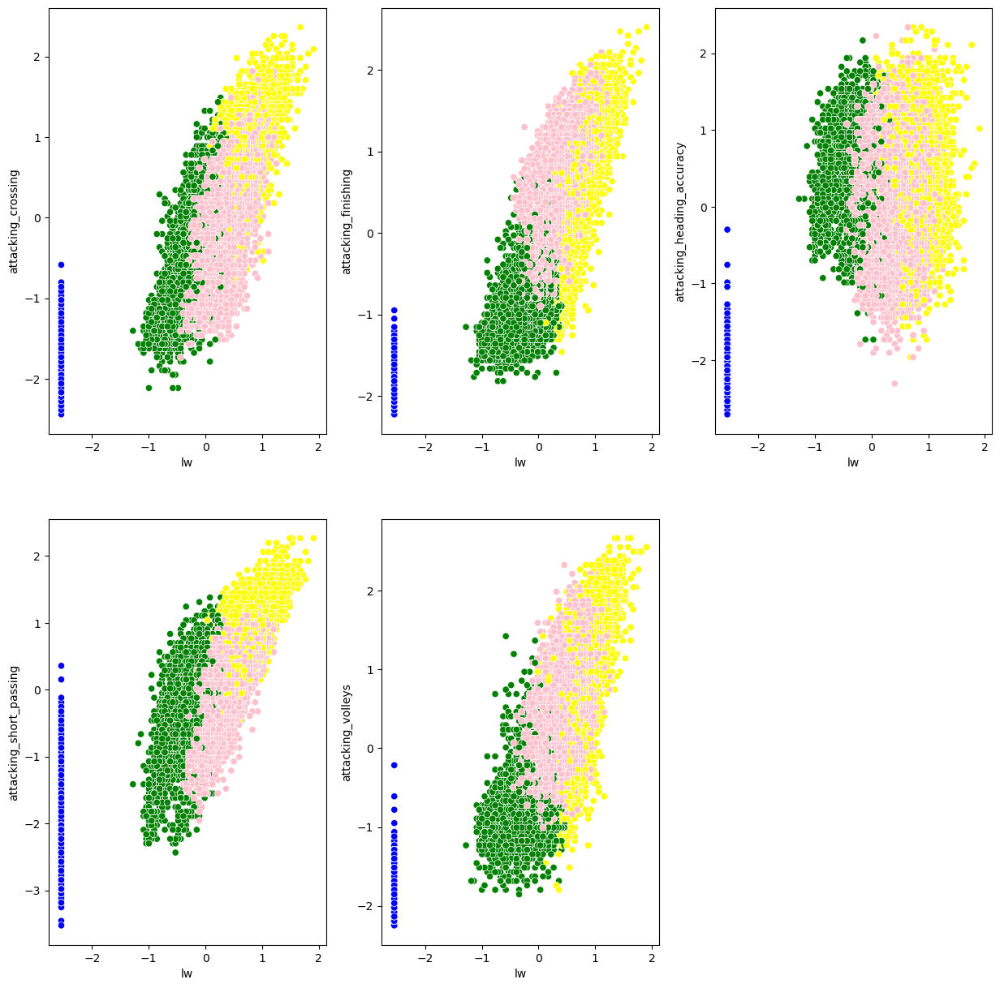

In [102]:
#Winger vs Attacking skills(for cluster 4)

plt.figure(figsize=(15,15))
plt_num = 1

fifa_data_bivar_cols = ["attacking_crossing", "attacking_finishing", "attacking_heading_accuracy",
                        "attacking_short_passing", "attacking_volleys"]

for column in fifa_data_bivar_cols:
    if plt_num <= 5:
        plt.subplot(2,3,plt_num)
        sns.scatterplot(x="lw", y=column, data=fifa_data_upd_scl_upd, color=color_scheme[kmea_clu_dup_fea_clu4_labels])
    plt_num += 1
plt.show()

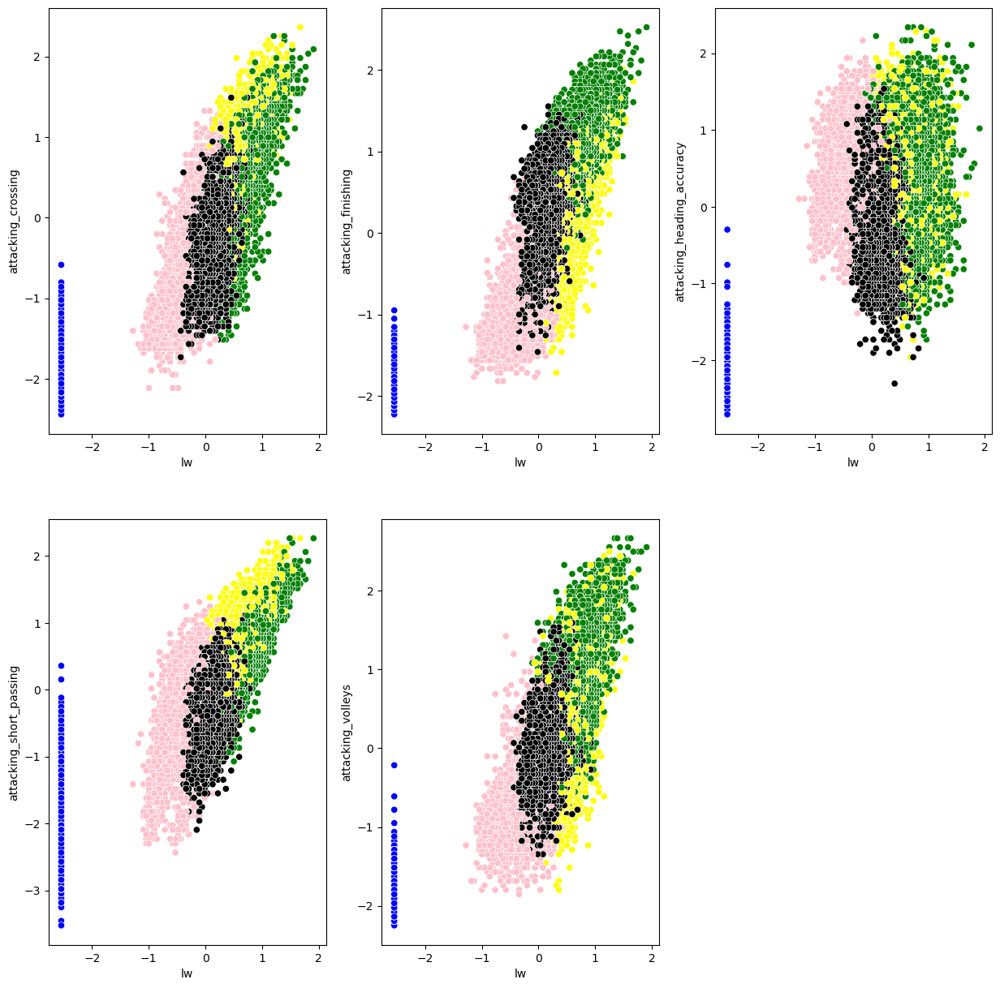

In [103]:
#Winger vs Attacking skills(for cluster 5)

plt.figure(figsize=(15,15))
plt_num = 1

fifa_data_bivar_cols = ["attacking_crossing", "attacking_finishing", "attacking_heading_accuracy",
                        "attacking_short_passing", "attacking_volleys"]

for column in fifa_data_bivar_cols:
    if plt_num <= 5:
        plt.subplot(2,3,plt_num)
        sns.scatterplot(x="lw", y=column, data=fifa_data_upd_scl_upd, color=color_scheme[kmea_clu_dup_fea_clu5_labels])
    plt_num += 1
plt.show()

#### Insights:
* The visuals show that the clusters are formed correctly for cluster 4 post which they overlap

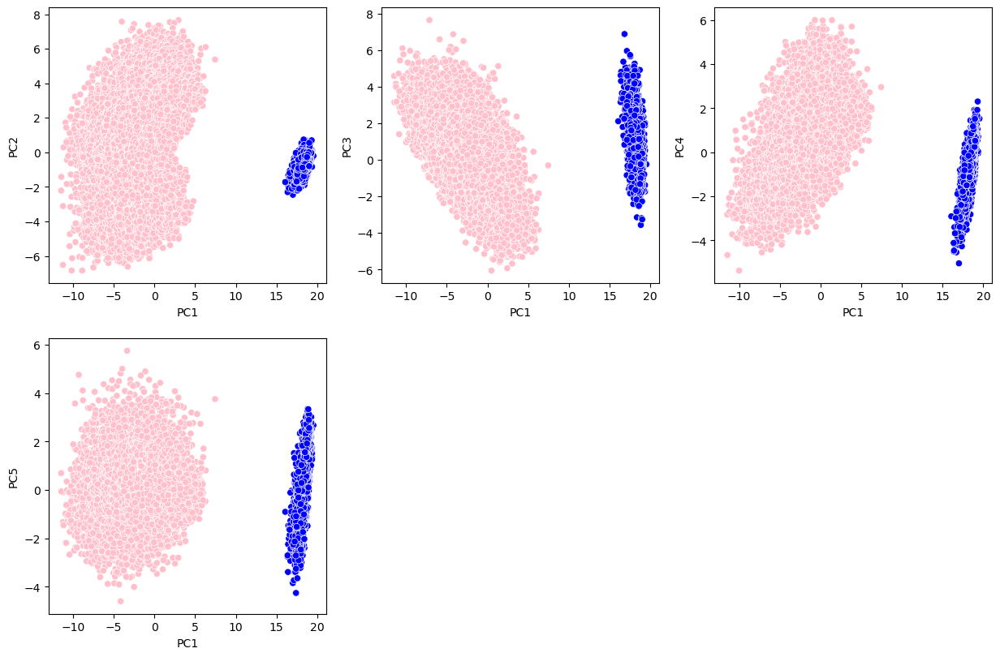

In [104]:
#PC1 vs other PCs(for cluster 2)
plt.figure(figsize=(15,15))
plt_num = 1

fifa_data_bivar_cols = ["PC2", "PC3", "PC4", "PC5"]

for column in fifa_data_bivar_cols:
    if plt_num <= 9:
        plt.subplot(3,3,plt_num)
        sns.scatterplot(x="PC1", y=column, data=fifa_data_pca, color=color_scheme[kmea_clu_pca_clu2_labels])
    plt_num += 1
plt.show()

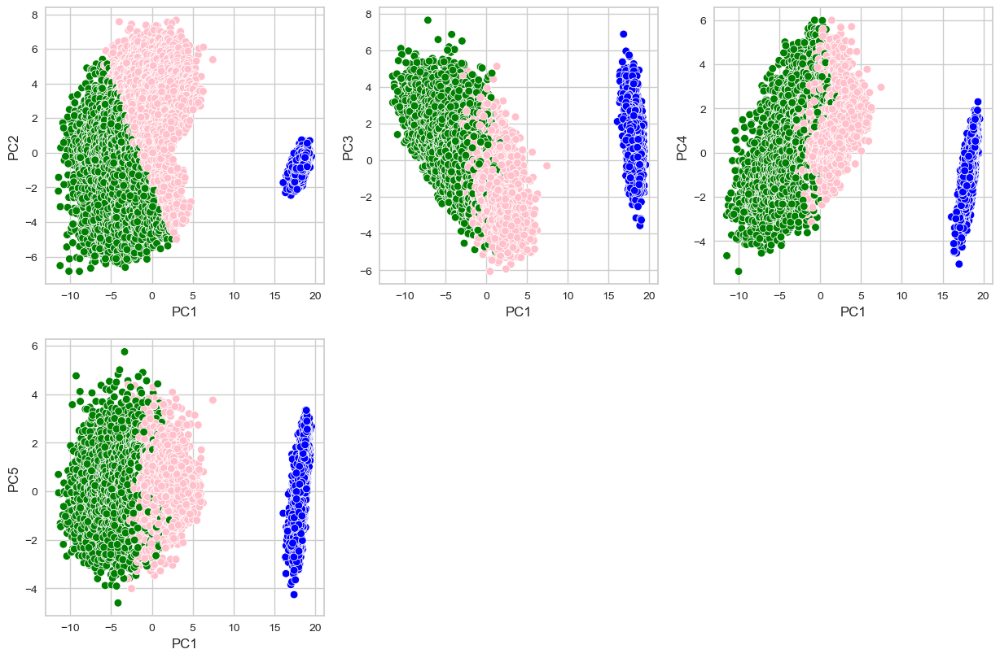

In [110]:
#PC1 vs other PCs(for cluster 3)

plt.figure(figsize=(15,15))
plt_num = 1

fifa_data_bivar_cols = ["PC2", "PC3", "PC4", "PC5"]

for column in fifa_data_bivar_cols:
    if plt_num <= 9:
        plt.subplot(3,3,plt_num)
        sns.scatterplot(x="PC1", y=column, data=fifa_data_pca, color=color_scheme[kmea_clu_pca_clu3_labels])
    plt_num += 1
plt.show()

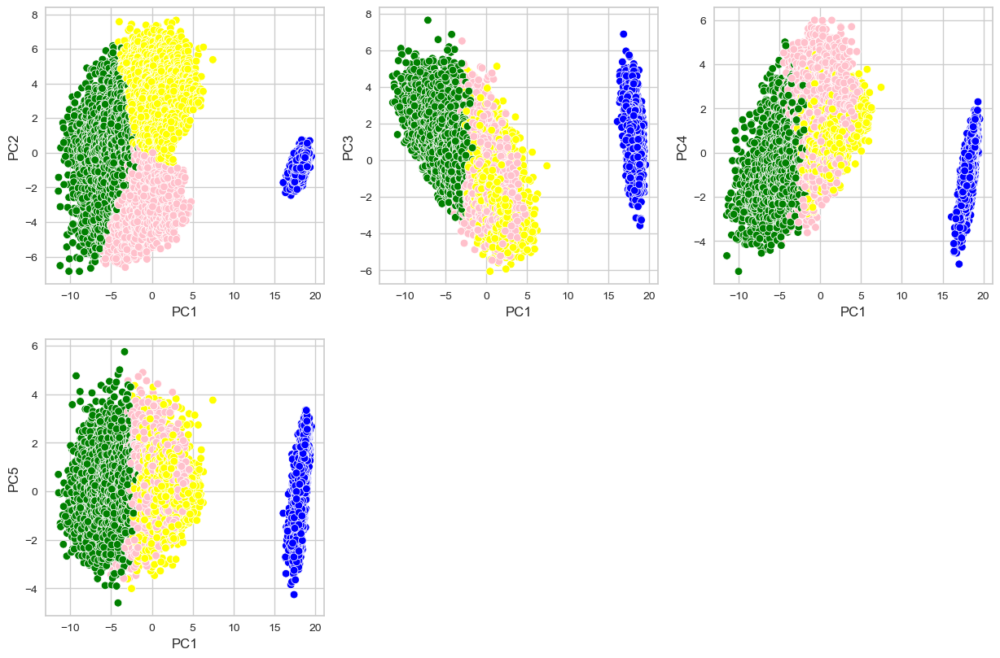

In [111]:
#PC1 vs other PCs(for cluster 4)

plt.figure(figsize=(15,15))
plt_num = 1

fifa_data_bivar_cols = ["PC2", "PC3", "PC4", "PC5"]

for column in fifa_data_bivar_cols:
    if plt_num <= 9:
        plt.subplot(3,3,plt_num)
        sns.scatterplot(x="PC1", y=column, data=fifa_data_pca, color=color_scheme[kmea_clu_pca_clu4_labels])
    plt_num += 1
plt.show()

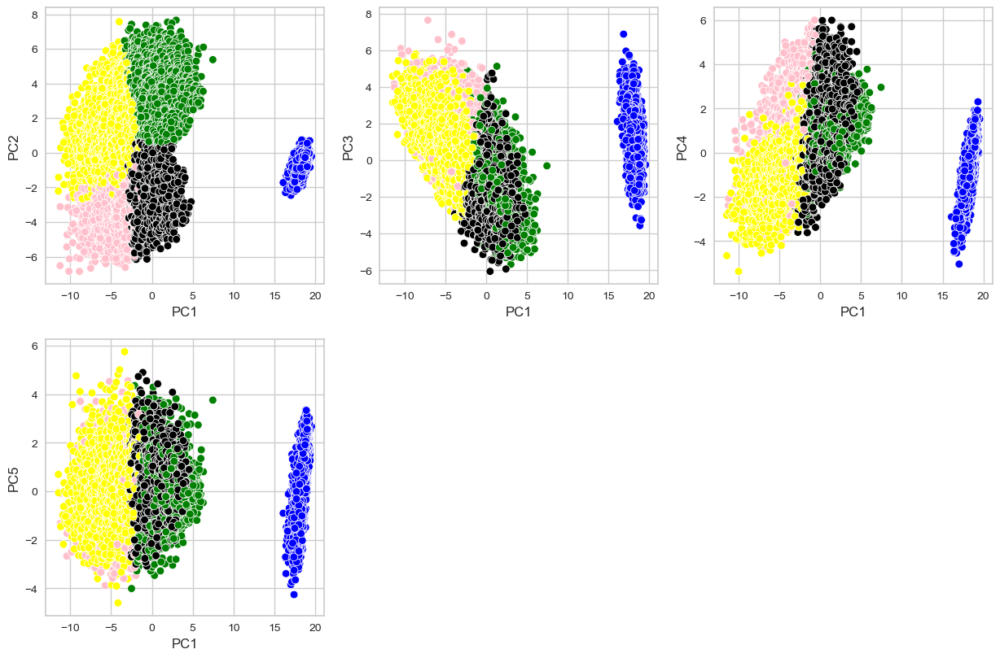

In [112]:
#PC1 vs other PCs(for cluster 5)

plt.figure(figsize=(15,15))
plt_num = 1

fifa_data_bivar_cols = ["PC2", "PC3", "PC4", "PC5"]

for column in fifa_data_bivar_cols:
    if plt_num <= 9:
        plt.subplot(3,3,plt_num)
        sns.scatterplot(x="PC1", y=column, data=fifa_data_pca, color=color_scheme[kmea_clu_pca_clu5_labels])
    plt_num += 1
plt.show()

#### Insights:
* The clusters are formed correctly for cluster size 4 post which they overlap

In [ ]:
#PC2 vs other PCs(for cluster 2)

plt.figure(figsize=(15,15))
plt_num = 1

fifa_data_bivar_cols = ["PC1", "PC3", "PC4", "PC5"]

for column in fifa_data_bivar_cols:
    if plt_num <= 9:
        plt.subplot(3,3,plt_num)
        sns.scatterplot(x="PC2", y=column, data=fifa_data_pca, color=color_scheme[kmea_clu_pca_clu2_labels])
    plt_num += 1
plt.show()


In [ ]:
#PC2 vs other PCs(for cluster 3)

plt.figure(figsize=(15,15))
plt_num = 1

fifa_data_bivar_cols = ["PC1", "PC3", "PC4", "PC5"]

for column in fifa_data_bivar_cols:
    if plt_num <= 9:
        plt.subplot(3,3,plt_num)
        sns.scatterplot(x="PC2", y=column, data=fifa_data_pca, color=color_scheme[kmea_clu_pca_clu3_labels])
    plt_num += 1
plt.show()

In [ ]:
# PC2 vs other PCs(for cluster 4)
plt.figure(figsize=(15,15))
plt_num = 1

fifa_data_bivar_cols = ["PC1", "PC3", "PC4", "PC5"]

for column in fifa_data_bivar_cols:
    if plt_num <= 9:
        plt.subplot(3,3,plt_num)
        sns.scatterplot(x="PC2", y=column, data=fifa_data_pca, color=color_scheme[kmea_clu_pca_clu4_labels])
    plt_num += 1
plt.show()

In [ ]:
#PC2 vs other PCs(for cluster 5)

plt.figure(figsize=(15,15))
plt_num = 1

fifa_data_bivar_cols = ["PC1", "PC3", "PC4", "PC5"]

for column in fifa_data_bivar_cols:
    if plt_num <= 9:
        plt.subplot(3,3,plt_num)
        sns.scatterplot(x="PC2", y=column, data=fifa_data_pca, color=color_scheme[kmea_clu_pca_clu5_labels])
    plt_num += 1
plt.show()

#### Insights:
* The clusters are formed correctly for cluster size 4 post which they overlap

In [ ]:
#PC3 vs other PCs(for cluster 2)

plt.figure(figsize=(15,15))
plt_num = 1

fifa_data_bivar_cols = ["PC1", "PC2", "PC4", "PC5"]

for column in fifa_data_bivar_cols:
    if plt_num <= 9:
        plt.subplot(3,3,plt_num)
        sns.scatterplot(x="PC3", y=column, data=fifa_data_pca, color=color_scheme[kmea_clu_pca_clu2_labels])
    plt_num += 1
plt.show()

In [ ]:
#PC3 vs other PCs(for cluster 3)

plt.figure(figsize=(15,15))
plt_num = 1

fifa_data_bivar_cols = ["PC1", "PC2", "PC4", "PC5"]

for column in fifa_data_bivar_cols:
    if plt_num <= 9:
        plt.subplot(3,3,plt_num)
        sns.scatterplot(x="PC3", y=column, data=fifa_data_pca, color=color_scheme[kmea_clu_pca_clu3_labels])
    plt_num += 1
plt.show()

In [ ]:
#PC3 vs other PCs(for cluster 4)

plt.figure(figsize=(15,15))
plt_num = 1

fifa_data_bivar_cols = ["PC1", "PC2", "PC4", "PC5"]

for column in fifa_data_bivar_cols:
    if plt_num <= 9:
        plt.subplot(3,3,plt_num)
        sns.scatterplot(x="PC3", y=column, data=fifa_data_pca, color=color_scheme[kmea_clu_pca_clu4_labels])
    plt_num += 1
plt.show()

In [ ]:
# PC3 vs other PCs(for cluster 5)

plt.figure(figsize=(15,15))
plt_num = 1

fifa_data_bivar_cols = ["PC1", "PC2", "PC4", "PC5"]

for column in fifa_data_bivar_cols:
    if plt_num <= 9:
        plt.subplot(3,3,plt_num)
        sns.scatterplot(x="PC3", y=column, data=fifa_data_pca, color=color_scheme[kmea_clu_pca_clu5_labels])
    plt_num += 1
plt.show()

#### Insights:
* The clusters are formed correctly for cluster size 4 post which they overlap

In [ ]:
#PC4 vs other PCs(for cluster 2)

plt.figure(figsize=(15,15))
plt_num = 1

fifa_data_bivar_cols = ["PC1", "PC2", "PC3", "PC5"]

for column in fifa_data_bivar_cols:
    if plt_num <= 9:
        plt.subplot(3,3,plt_num)
        sns.scatterplot(x="PC4", y=column, data=fifa_data_pca, color=color_scheme[kmea_clu_pca_clu2_labels])
    plt_num += 1
plt.show()


In [ ]:
# PC4 vs other PCs(for cluster 3)
plt.figure(figsize=(15,15))
plt_num = 1

fifa_data_bivar_cols = ["PC1", "PC2", "PC3", "PC5"]

for column in fifa_data_bivar_cols:
    if plt_num <= 9:
        plt.subplot(3,3,plt_num)
        sns.scatterplot(x="PC4", y=column, data=fifa_data_pca, color=color_scheme[kmea_clu_pca_clu3_labels])
    plt_num += 1
plt.show()


In [ ]:
#PC4 vs other PCs(for cluster 4)

plt.figure(figsize=(15,15))
plt_num = 1

fifa_data_bivar_cols = ["PC1", "PC2", "PC3", "PC5"]

for column in fifa_data_bivar_cols:
    if plt_num <= 9:
        plt.subplot(3,3,plt_num)
        sns.scatterplot(x="PC4", y=column, data=fifa_data_pca, color=color_scheme[kmea_clu_pca_clu4_labels])
    plt_num += 1
plt.show()

In [ ]:
#PC4 vs other PCs(for cluster 5)

plt.figure(figsize=(15,15))
plt_num = 1

fifa_data_bivar_cols = ["PC1", "PC2", "PC3", "PC5"]

for column in fifa_data_bivar_cols:
    if plt_num <= 9:
        plt.subplot(3,3,plt_num)
        sns.scatterplot(x="PC4", y=column, data=fifa_data_pca, color=color_scheme[kmea_clu_pca_clu5_labels])
    plt_num += 1
plt.show()

#### Insights:
* The clusters are formed correctly for cluster size 4 post which they overlap

In [ ]:
#PC5 vs other PCs(for cluster 2)
plt.figure(figsize=(15,15))
plt_num = 1

fifa_data_bivar_cols = ["PC1", "PC2", "PC3", "PC4"]

for column in fifa_data_bivar_cols:
    if plt_num <= 9:
        plt.subplot(3,3,plt_num)
        sns.scatterplot(x="PC5", y=column, data=fifa_data_pca, color=color_scheme[kmea_clu_pca_clu2_labels])
    plt_num += 1
plt.show()

In [ ]:
#PC5 vs other PCs(for cluster 3)

plt.figure(figsize=(15,15))
plt_num = 1

fifa_data_bivar_cols = ["PC1", "PC2", "PC3", "PC4"]

for column in fifa_data_bivar_cols:
    if plt_num <= 9:
        plt.subplot(3,3,plt_num)
        sns.scatterplot(x="PC5", y=column, data=fifa_data_pca, color=color_scheme[kmea_clu_pca_clu3_labels])
    plt_num += 1
plt.show()


In [ ]:
#PC5 vs other PCs(for cluster 4)
plt.figure(figsize=(15,15))
plt_num = 1

fifa_data_bivar_cols = ["PC1", "PC2", "PC3", "PC4"]

for column in fifa_data_bivar_cols:
    if plt_num <= 9:
        plt.subplot(3,3,plt_num)
        sns.scatterplot(x="PC5", y=column, data=fifa_data_pca, color=color_scheme[kmea_clu_pca_clu4_labels])
    plt_num += 1
plt.show()


In [ ]:
#PC5 vs other PCs(for cluster 5)
plt.figure(figsize=(15,15))
plt_num = 1

fifa_data_bivar_cols = ["PC1", "PC2", "PC3", "PC4"]

for column in fifa_data_bivar_cols:
    if plt_num <= 9:
        plt.subplot(3,3,plt_num)
        sns.scatterplot(x="PC5", y=column, data=fifa_data_pca, color=color_scheme[kmea_clu_pca_clu5_labels])
    plt_num += 1
plt.show()

#### Insights:
* The clusters are formed correctly for cluster size 4 post which they overlap
* Multiple 2D visualizations done post clusteting. PCA's visualization gives better view when compared with pre-processed features' clustering. The optimal cluster size is 4

 **Silhouette score prediction**

In [ ]:
#for duplicate features
from sklearn.metrics import silhouette_score

print("Silhouette score for dataframe created via Duplicated features method\n")

print("Silhouette score(Dupl features, cluster 2):",
      round(silhouette_score(fifa_data_upd_scl_upd, kmea_clu_dup_fea_clu2_labels, metric='euclidean'), 3))

print("Silhouette score(Dupl features, cluster 3):",
      round(silhouette_score(fifa_data_upd_scl_upd, kmea_clu_dup_fea_clu3_labels, metric='euclidean'), 3))

print("Silhouette score(Dupl features, cluster 4):",
      round(silhouette_score(fifa_data_upd_scl_upd, kmea_clu_dup_fea_clu4_labels, metric='euclidean'), 3))

print("Silhouette score(Dupl features, cluster 5):",
      round(silhouette_score(fifa_data_upd_scl_upd, kmea_clu_dup_fea_clu5_labels, metric='euclidean'), 3))

#### Insights:
* Silhouette score is high for cluster size 
* Silhouette score decreases as the cluster size increases

In [ ]:
#for PCA
print("Silhouette score for dataframe created via PCA\n")

print("Silhouette score(PCA, cluster 2):",
      round(silhouette_score(fifa_data_pca, kmea_clu_pca_clu2_labels, metric='euclidean'), 3))

print("Silhouette score(PCA, cluster 3):",
      round(silhouette_score(fifa_data_pca, kmea_clu_pca_clu3_labels, metric='euclidean'), 3))

print("Silhouette score(PCA, cluster 4):",
      round(silhouette_score(fifa_data_pca, kmea_clu_pca_clu4_labels, metric='euclidean'), 3))

print("Silhouette score(PCA, cluster 5):",
      round(silhouette_score(fifa_data_pca, kmea_clu_pca_clu5_labels, metric='euclidean'), 3))

#### Silhouette visualizer 

In [107]:
pip install yellowbrick

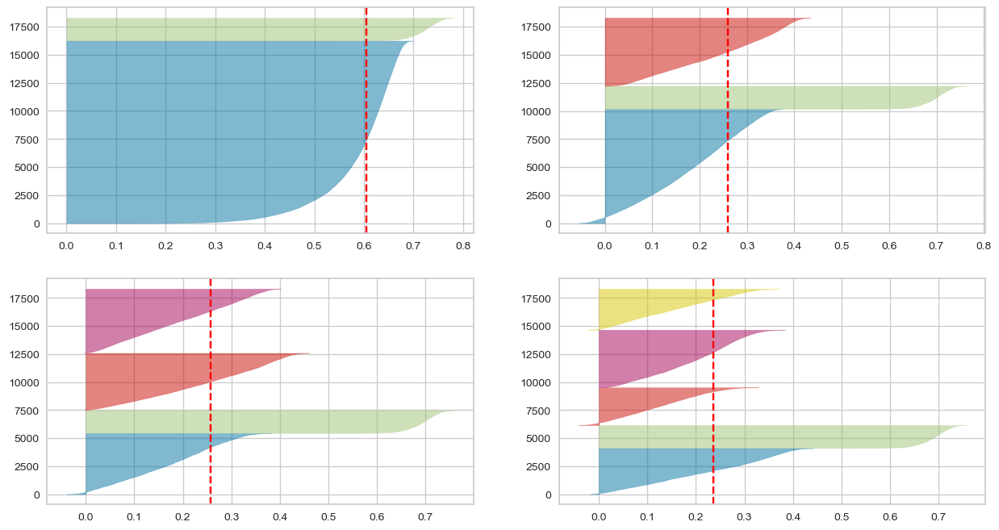

In [108]:
#for duplicates features
from yellowbrick.cluster import SilhouetteVisualizer

fig, ax = plt.subplots(2,2,figsize=(15,8))

for i in range(2,6):
    kmea_clu_dup_fea = KMeans(n_clusters=i, random_state=9)
    q, mod = divmod(i,2)
    sil_vis_dup_fea = SilhouetteVisualizer(kmea_clu_dup_fea, colors='yellowbrick', ax=ax[q-1][mod])
    sil_vis_dup_fea.fit(fifa_data_upd_scl_upd)

#### Insights:
*  Cluster 2 has high Silhouette score
* Also, the clusters seemed for form correctly till cluster size 4 post which the clusters overlap

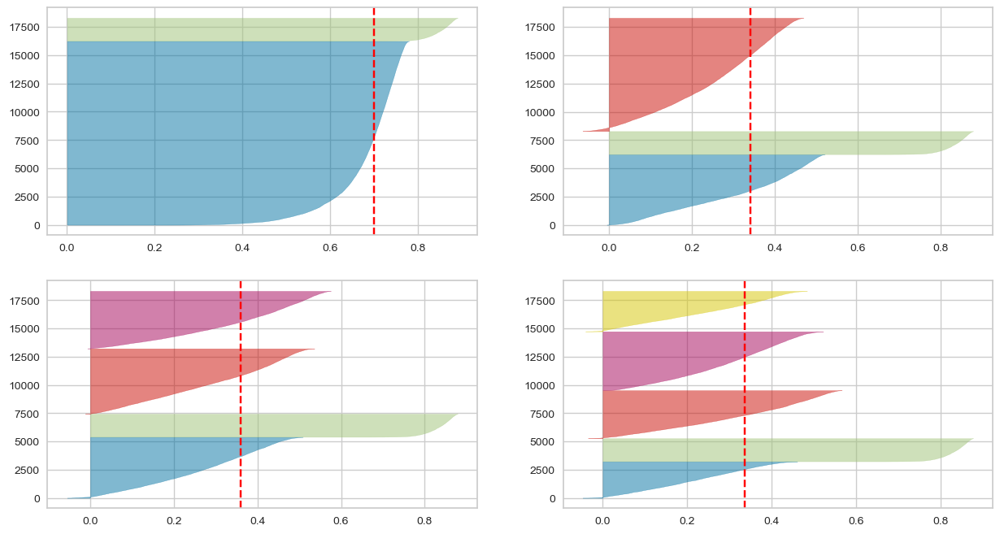

In [109]:
#for PCA
fig, ax = plt.subplots(2,2,figsize=(15,8))

for i in range(2,6):
    kmea_clu_pca = KMeans(n_clusters=i, random_state=9)
    q, mod = divmod(i,2)
    sil_vis_pca = SilhouetteVisualizer(kmea_clu_pca, colors='yellowbrick', ax=ax[q-1][mod])
    sil_vis_pca.fit(fifa_data_pca)

#### Insights:
*  Cluster 2 has high Silhouette score
* Also, the clusters seemed for form correctly till cluster size 4 post which the clusters overlap

* As per the various graphs/visuals analysed for the KMeans clusteting, we could see that

* the clusters are formed correctly for cluster size 4

* above the cluster size 4, the cluster border overlaps with each other

* the elbow method predicts the optimum cluster size as 4

* though the Silhouette score is maximum for cluster size 2, clusters are formed correctly for cluster size 4 post
   which the clusters overlap

* Hence, the cluster size could be taken as 4

#### Evaluation of Hierarchical clustering

#### Insights:
* We could see that branches 3 to 6 do not vary significantly(in length) indiating that we can't consider clusters more than 2(refer the dendrogram.


 **Optimal cluster size can be taken as 4(identified via KMeans clustetring)**

### Conclusion

* Through KMeans clustering, we could form 4 clusters of players based on their skills